In [1]:
!pip install yfinance --upgrade --no-cache-dir

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
from dateutil.relativedelta import relativedelta
import yfinance as yf
from sklearn.cluster import KMeans
from colorama import Fore, Style
import seaborn as sns
from sklearn.metrics import r2_score
sns.set(style='darkgrid')
import plotly.graph_objects as go
import pickle

import sys
sys.path.append('../src') 
from stock_strategy import stock_strategy, stock_regression

from scipy.stats import norm
from scipy.optimize import minimize
from scipy.optimize import fsolve, curve_fit

from kneed import KneeLocator

In [3]:
list_base = [
    'brk-b','cost','voo','xlk','xlv','aapl','wmt','ita', 'coke', 'race','msft','hesay', 'axp','googl',
    'abbv','lly','ma', 'rtx', # 'inda',
    'pg','xlp','lmt', # stable, but not for long hold given low return
] 
list_swing = [
    'cat','itb','gs', 'xlf','hd','jpm','smh',
    'jef',
    'unh', 
    'fico',
    'nvda',#'tsla',
    'fbtc',
]
list_ref = ['gld', 'xle']
list_check = ['fngs', 'dis', 'hpq', 'cof']
list_robinhood_only = ['cmg', 'panw']

In [4]:
dict_to_lookat = {'base_stock': [], 'swing_stock': []}
for base_stock in list_base:
    stock = stock_strategy(base_stock)
    if stock.ticker['Close'].tolist()[0] / stock.df['high'].max() < 0.93:
        dict_to_lookat['base_stock'].append(base_stock)
for swing_stock in list_swing:
    stock = stock_strategy(swing_stock)
    if stock.ticker['Close'].tolist()[0] / stock.df['high'].max() < 0.86:
        dict_to_lookat['swing_stock'].append(swing_stock)     
print(dict_to_lookat)

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%********

{'base_stock': ['brk-b', 'cost', 'xlv', 'aapl', 'wmt', 'coke', 'race', 'hesay', 'axp', 'googl', 'abbv', 'lly', 'pg', 'lmt'], 'swing_stock': ['itb', 'hd', 'jef', 'unh', 'fico']}


## Base

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

* Current stock price: 488.06 ~ up 490.99 , down 486.93
* Recent high: 542.07
* Current stock price is at 90.03999999999999% of recent high
Latest 20 Day MA: 500.8
Latest Lower Bollinger Band, 20MA: 484.16
Latest Higher Bollinger Band, 20MA: 517.45
Latest 50 Day MA: 511.99
Latest Lower Bollinger Band, 50MA: 475.41
Latest Higher Bollinger Band, 50MA: 548.57
Latest 50 Day EMA: 505.59
Latest 120 Day MA: 494.87
Latest 200 Day MA: 481.7
Latest 200 Day EMA: 480.93

Latest RSI: 35.22 
Latest MACD Divergence: -0.87 
20MA crosses 50MA at 863.12
20MA break point: 501.36
20MA Lower Bollinger Band break point: 482.38
20MA Upper Bollinger Band break point: 520.33
50MA break point: 512.43
50MA Lower Bollinger Band break point: 473.33
50MA Upper Bollinger Band break point: 551.53
120MA break point: 494.91
200MA break point: 481.66
[[341.39911741]
 [358.39569943]
 [393.29742038]
 [407.91409024]
 [433.72153884]
 [452.89816886]
 [466.82341003]
 [486.93724113]
 [506.24999797]
 [525.69216521]]
[[344.76078


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Regression price since 2010:  462.38
Regression price since 2020:  500.65


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Regression price since QE:  502.25
Current RSI: 33.59 
Current MACD Divergence: -0.76 
Tomorrow inferred RSI: 24.41 
Tomorrow inferred MACD Divergence: -0.6 


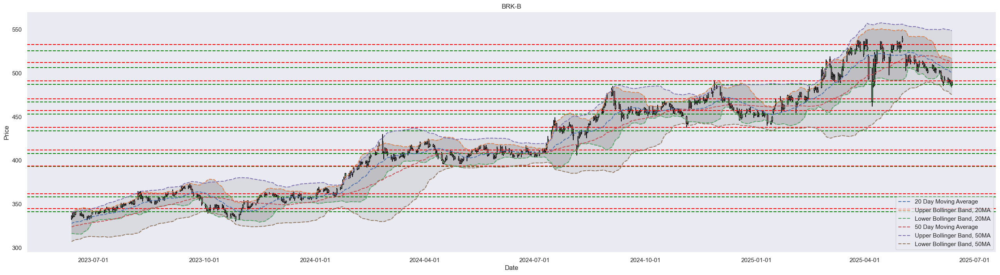

In [5]:
# 6/12/2025 min 483.81, 4/7/2025 462.10; 2/3/2025 454.60; 1/10/2025 440.10; 11/4/2024 437.90; 
# 487 good support
# 433 / 453 strong supp
stock_name = 'brk-b'

stock_strategy(stock_name, strategy='daily').output()

print('Regression price since 2010: ', stock_regression(stock_name))
print('Regression price since 2020: ', stock_regression(stock_name, regression_start='2020-01-01'))
print('Regression price since QE: ', stock_regression(stock_name, regression_start='2020-03-20'))
stock_strategy(stock_name).latest_metric()
stock_strategy(stock_name).infer_metric()

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

* Current stock price: 991.81 ~ up 994.54 , down 973.76
* Recent high: 1076.83
* Current stock price is at 92.10000000000001% of recent high
Latest 20 Day MA: 1022.1
Latest Lower Bollinger Band, 20MA: 985.96
Latest Higher Bollinger Band, 20MA: 1058.25
Latest 50 Day MA: 995.7
Latest Lower Bollinger Band, 50MA: 912.64
Latest Higher Bollinger Band, 50MA: 1078.76
Latest 50 Day EMA: 1001.91
Latest 120 Day MA: 980.26
Latest 200 Day MA: 953.47
Latest 200 Day EMA: 942.76

Latest RSI: 44.94 
Latest MACD Divergence: -5.52 
20MA crosses 50MA at 122.73
20MA break point: 1023.12
20MA Lower Bollinger Band break point: 981.4
20MA Upper Bollinger Band break point: 1064.85
50MA break point: 995.56
50MA Lower Bollinger Band break point: 904.73
50MA Upper Bollinger Band break point: 1086.39
120MA break point: 980.07
200MA break point: 953.22
[[ 530.74281198]
 [ 583.01178881]
 [ 661.78038282]
 [ 717.00853746]
 [ 790.6981396 ]
 [ 838.58566399]
 [ 880.82069239]
 [ 924.24830184]
 [ 973.76429469]
 [1025.83093


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Regression price since 2010:  974.07
Regression price since 2020:  1007.92


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Regression price since QE:  1009.88
Current RSI: 44.57 
Current MACD Divergence: -6.05 
Tomorrow inferred RSI: 41.01 
Tomorrow inferred MACD Divergence: -6.12 


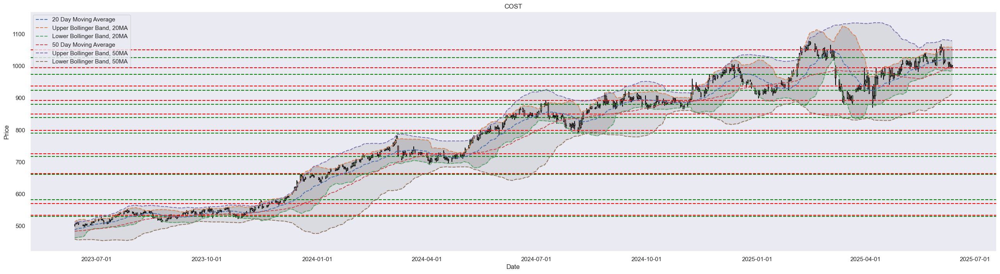

In [6]:
# 715 maximal drawback
# Buy 881 - 884
# Very strong supp: 793 - 783
# 6/11/2025 min 993.38, 5/15/2025 983.00, 4/21/2025 942.97, 4/7/2025 871.71, 10/2/2024 867.16, 8/5/2024 793.00
stock_name = 'cost'

stock_strategy(stock_name, strategy='daily').output()
print('Regression price since 2010: ', stock_regression(stock_name))
print('Regression price since 2020: ', stock_regression(stock_name, regression_start='2020-01-01'))
print('Regression price since QE: ', stock_regression(stock_name, regression_start='2020-03-20'))
stock_strategy(stock_name).latest_metric()
stock_strategy(stock_name).infer_metric()

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

* Current stock price: 550.4
* Recent high: 561.97
* Current stock price is at 97.94% of recent high
Latest 20 Day MA: 545.12
Latest Lower Bollinger Band, 20MA: 532.86
Latest Higher Bollinger Band, 20MA: 557.37
Latest 50 Day MA: 518.95
Latest Lower Bollinger Band, 50MA: 450.12
Latest Higher Bollinger Band, 50MA: 587.78
Latest 50 Day EMA: 531.95
Latest 120 Day MA: 530.6
Latest 200 Day MA: 530.05
Latest 200 Day EMA: 520.57

Latest RSI: 72.34 
Latest MACD Divergence: -0.05 
50MA crosses 200MA at 1295.07
20MA break point: 544.6
20MA Lower Bollinger Band break point: 531.06
20MA Upper Bollinger Band break point: 558.14
50MA break point: 518.22
50MA Lower Bollinger Band break point: 444.26
50MA Upper Bollinger Band break point: 592.17
120MA break point: 530.4
200MA break point: 529.93


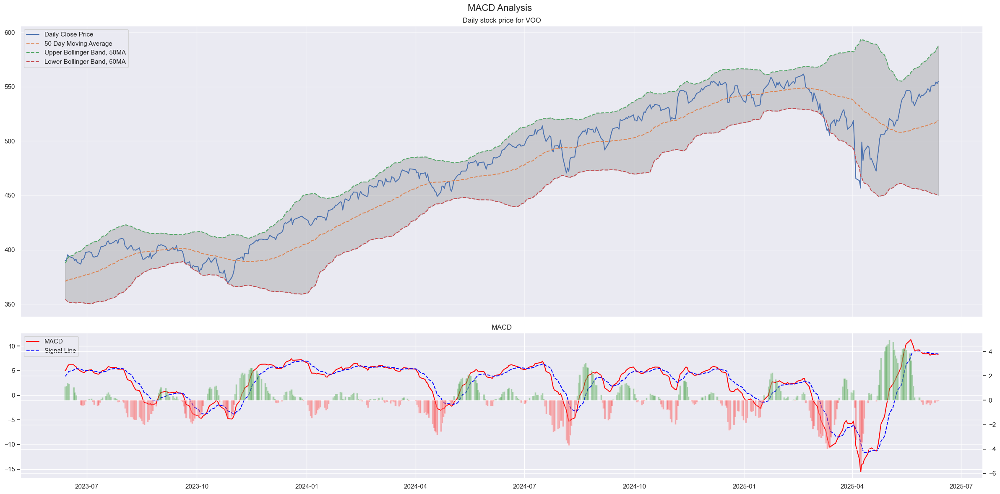

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Regression price since 2010:  535.65
Regression price since 2020:  535.91


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Regression price since QE:  535.19
Current RSI: 70.72 
Current MACD Divergence: -0.41 
Tomorrow inferred RSI: 60.83 
Tomorrow inferred MACD Divergence: -0.68 


In [7]:
# Strong supp: 473 - 470.7
# 452 based on maximal drawback ()/0.9, also regression and drawback ()/0.95, also support
# next support 428
# 4/7/2025 low 442.80; 2024/4/19 453.90 last min before increase
stock_name = 'voo'
# stock_name = '^GSPC' # sp500

stock_strategy(stock_name).output()
print('Regression price since 2010: ', stock_regression(stock_name))
print('Regression price since 2020: ', stock_regression(stock_name, regression_start='2020-01-01'))
print('Regression price since QE: ', stock_regression(stock_name, regression_start='2020-03-20'))
stock_strategy(stock_name).latest_metric()
stock_strategy(stock_name).infer_metric()

[*********************100%***********************]  1 of 1 completed


* Current stock price: 239.83
* Recent high: 243.13
* Current stock price is at 98.64% of recent high
Latest 20 Day MA: 234.65
Latest Lower Bollinger Band, 20MA: 226.13
Latest Higher Bollinger Band, 20MA: 243.17
Latest 50 Day MA: 217.03
Latest Lower Bollinger Band, 50MA: 171.3
Latest Higher Bollinger Band, 50MA: 262.77
Latest 50 Day EMA: 225.3
Latest 120 Day MA: 223.02
Latest 200 Day MA: 224.59
Latest 200 Day EMA: 220.61

Latest RSI: 77.51 
Latest MACD Divergence: 0.06 


[*********************100%***********************]  1 of 1 completed

50MA crosses 200MA at 746.64
20MA break point: 234.23
20MA Lower Bollinger Band break point: 225.09
20MA Upper Bollinger Band break point: 243.37
50MA break point: 216.51
50MA Lower Bollinger Band break point: 167.5
50MA Upper Bollinger Band break point: 265.53
120MA break point: 222.85
200MA break point: 224.5


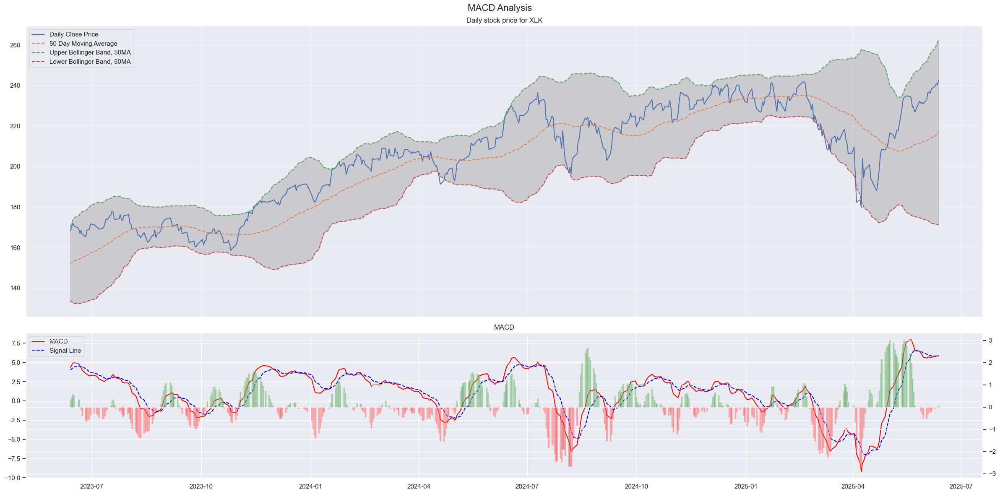

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Regression price since 2010:  243.78
Regression price since 2020:  236.23


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Regression price since QE:  235.37
Current RSI: 76.87 
Current MACD Divergence: -0.13 
Tomorrow inferred RSI: 70.25 
Tomorrow inferred MACD Divergence: -0.29 


In [8]:
# 4/7/2025 172.45; 4/4/2025 182.69 - 1/5/2024 183.42, last min before increase; then 2023/10/26 159.50
# 183 supp
# massive buy at 200 based on regression drawback ()/0.9/0.95

stock_name = 'xlk'

stock_strategy(stock_name).output()
print('Regression price since 2010: ', stock_regression(stock_name))
print('Regression price since 2020: ', stock_regression(stock_name, regression_start='2020-01-01'))
print('Regression price since QE: ', stock_regression(stock_name, regression_start='2020-03-20'))
stock_strategy(stock_name).latest_metric()
stock_strategy(stock_name).infer_metric()

[*********************100%***********************]  1 of 1 completed


* Current stock price: 136.51
* Recent high: 157.72
* Current stock price is at 86.55000000000001% of recent high
Latest 20 Day MA: 133.13
Latest Lower Bollinger Band, 20MA: 129.51
Latest Higher Bollinger Band, 20MA: 136.75
Latest 50 Day MA: 135.1
Latest Lower Bollinger Band, 50MA: 127.18
Latest Higher Bollinger Band, 50MA: 143.02
Latest 50 Day EMA: 135.81
Latest 120 Day MA: 140.17
Latest 200 Day MA: 143.57
Latest 200 Day EMA: 140.67

Latest RSI: 85.33 
Latest MACD Divergence: 0.71 


[*********************100%***********************]  1 of 1 completed

20MA crosses 50MA at 202.33
50MA crosses 200MA at 701.3
20MA break point: 132.94
20MA Lower Bollinger Band break point: 129.15
20MA Upper Bollinger Band break point: 136.73
50MA break point: 135.06
50MA Lower Bollinger Band break point: 126.43
50MA Upper Bollinger Band break point: 143.7
120MA break point: 140.2
200MA break point: 143.6


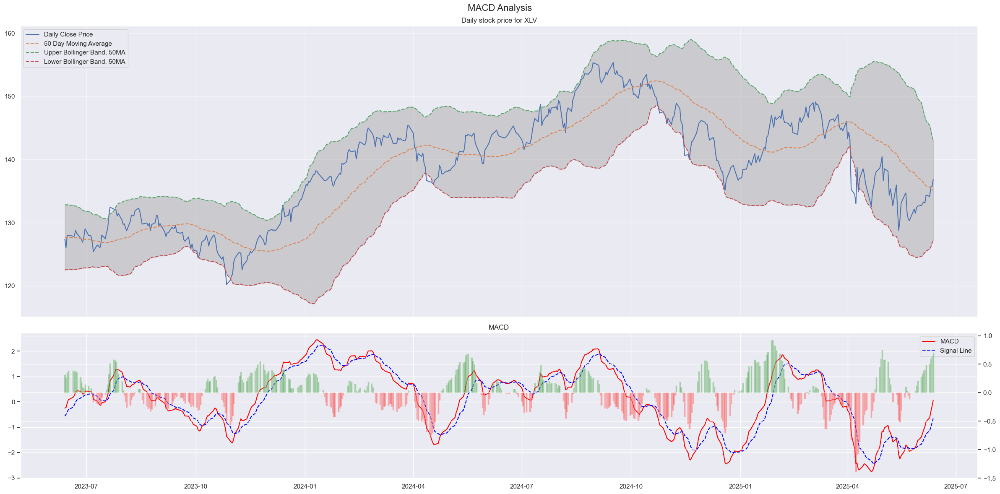

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Regression price since 2010:  162.22
Regression price since 2020:  151.43


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Regression price since QE:  150.7


[*********************100%***********************]  1 of 1 completed

Current RSI: 84.47 
Current MACD Divergence: 0.7 
Tomorrow inferred RSI: 80.62 
Tomorrow inferred MACD Divergence: 0.67 


In [9]:
stock_name = 'xlv'
# return limited, buy when > 3% below the regression
# 05/23/2025 129.55, 5/15/2025 127.35, 10/27/2023 low 122.59
# 127.34 maximal drawback
# 129.19 regression drawback

stock_strategy(stock_name).output()

print('Regression price since 2010: ', stock_regression(stock_name))
print('Regression price since 2020: ', stock_regression(stock_name, regression_start='2020-01-01'))
print('Regression price since QE: ', stock_regression(stock_name, regression_start='2020-03-20'))
stock_strategy(stock_name).latest_metric()
stock_strategy(stock_name).infer_metric()

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

* Current stock price: 196.56 ~ up 203.11 , down 189.83
* Recent high: 259.47
* Current stock price is at 75.75% of recent high
Latest 20 Day MA: 202.65
Latest Lower Bollinger Band, 20MA: 194.44
Latest Higher Bollinger Band, 20MA: 210.86
Latest 50 Day MA: 201.84
Latest Lower Bollinger Band, 50MA: 180.63
Latest Higher Bollinger Band, 50MA: 223.05
Latest 50 Day EMA: 205.85
Latest 120 Day MA: 220.57
Latest 200 Day MA: 224.13
Latest 200 Day EMA: 215.13

Latest RSI: 46.27 
Latest MACD Divergence: -0.12 
20MA crosses 50MA at 172.24
50MA crosses 200MA at 1685.44
20MA break point: 202.83
20MA Lower Bollinger Band break point: 193.23
20MA Upper Bollinger Band break point: 212.43
50MA break point: 201.89
50MA Lower Bollinger Band break point: 178.71
50MA Upper Bollinger Band break point: 225.07
120MA break point: 220.75
200MA break point: 224.26
[[167.87028476]
 [174.10936525]
 [181.95529984]
 [189.83181322]
 [199.35952414]
 [209.46763141]
 [219.12573712]
 [225.98683096]
 [233.85884026]
 [245.51


[*********************100%***********************]  1 of 1 completed


Regression price since 2010:  257.39


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Regression price since 2020:  237.02
Regression price since QE:  234.89


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Current RSI: 52.55 
Current MACD Divergence: -0.33 
Tomorrow inferred RSI: 41.15 
Tomorrow inferred MACD Divergence: -0.43 


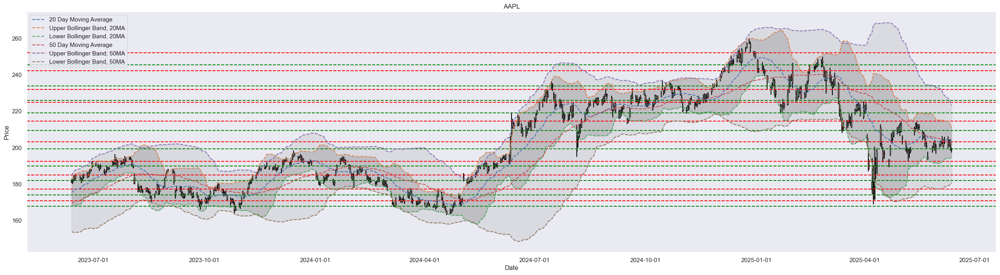

In [10]:
# 185.6 - maximal drawback / 0.95; 188 - regression drawback / 0.95
# 174.6 maximal drawback since QE; 179.8 regression drawback
# 6/13/2025 min 195.91, 5/30/2025 196.78, 5/23/2025 193.46, 5/7/2025 193.25, 4/21/2025 189.81, 4/8/2025 169.21; 4/19/2024 164.08
stock_name = 'aapl'

stock_strategy(stock_name, strategy='daily').output()

print('Regression price since 2010: ', stock_regression(stock_name))
print('Regression price since 2020: ', stock_regression(stock_name, regression_start='2020-01-01'))
print('Regression price since QE: ', stock_regression(stock_name, regression_start='2020-03-20'))
stock_strategy(stock_name).latest_metric()
stock_strategy(stock_name).infer_metric()

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

* Current stock price: 94.64
* Recent high: 104.76
* Current stock price is at 90.35% of recent high
Latest 20 Day MA: 97.49
Latest Lower Bollinger Band, 20MA: 94.81
Latest Higher Bollinger Band, 20MA: 100.16
Latest 50 Day MA: 95.08
Latest Lower Bollinger Band, 50MA: 84.54
Latest Higher Bollinger Band, 50MA: 105.62
Latest 50 Day EMA: 95.68
Latest 120 Day MA: 93.89
Latest 200 Day MA: 89.54
Latest 200 Day EMA: 88.18

Latest RSI: 44.59 
Latest MACD Divergence: -0.51 
20MA crosses 50MA at 14.55
20MA break point: 97.63
20MA Lower Bollinger Band break point: 94.81
20MA Upper Bollinger Band break point: 100.45
50MA break point: 95.09
50MA Lower Bollinger Band break point: 83.56
50MA Upper Bollinger Band break point: 106.61
120MA break point: 93.89
200MA break point: 89.51


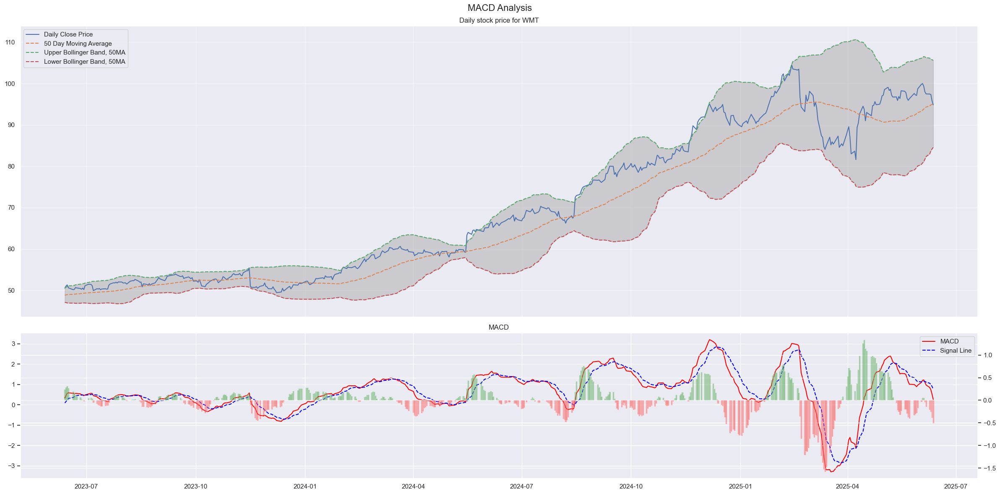

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Regression price since 2010:  77.2
Regression price since 2020:  84.93


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Regression price since QE:  85.38
Current RSI: 41.47 
Current MACD Divergence: -0.58 


[*********************100%***********************]  1 of 1 completed


Tomorrow inferred RSI: 33.12 
Tomorrow inferred MACD Divergence: -0.6 


In [11]:
stock_name = 'wmt'

stock_strategy(stock_name).output()

print('Regression price since 2010: ', stock_regression(stock_name))
print('Regression price since 2020: ', stock_regression(stock_name, regression_start='2020-01-01'))
print('Regression price since QE: ', stock_regression(stock_name, regression_start='2020-03-20'))
stock_strategy(stock_name).latest_metric()
stock_strategy(stock_name).infer_metric()

[*********************100%***********************]  1 of 1 completed

* Current stock price: 180.34
* Recent high: 183.23
* Current stock price is at 98.42% of recent high
Latest 20 Day MA: 176.38
Latest Lower Bollinger Band, 20MA: 168.19
Latest Higher Bollinger Band, 20MA: 184.57
Latest 50 Day MA: 162.65
Latest Lower Bollinger Band, 50MA: 129.25
Latest Higher Bollinger Band, 50MA: 196.05
Latest 50 Day EMA: 167.26
Latest 120 Day MA: 156.27
Latest 200 Day MA: 153.31
Latest 200 Day EMA: 153.37

Latest RSI: 74.75 
Latest MACD Divergence: -0.39 



[*********************100%***********************]  1 of 1 completed

20MA break point: 176.21
20MA Lower Bollinger Band break point: 166.6
20MA Upper Bollinger Band break point: 185.83
50MA break point: 162.31
50MA Lower Bollinger Band break point: 126.38
50MA Upper Bollinger Band break point: 198.24
120MA break point: 156.07
200MA break point: 153.17


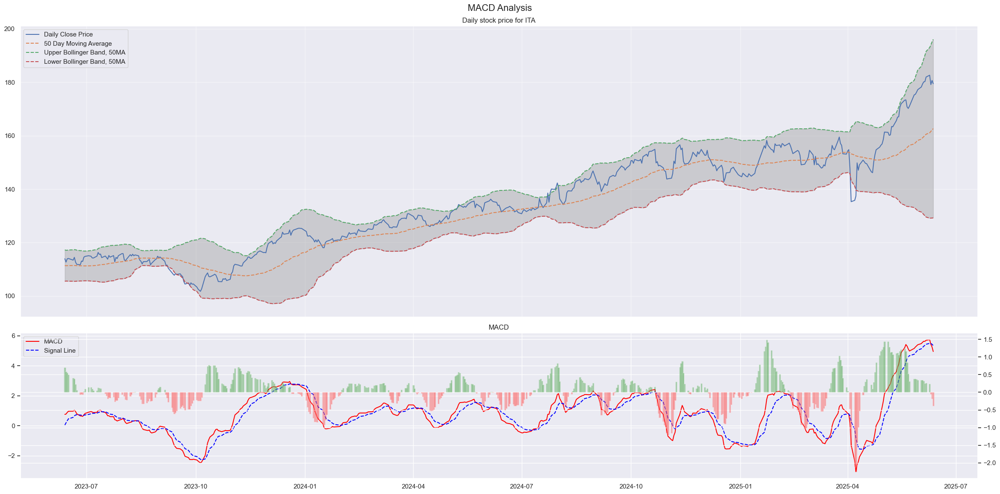

[*********************100%***********************]  1 of 1 completed


Regression price since 2010:  151.78


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Regression price since 2020:  152.69
Regression price since QE:  154.74


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Current RSI: 74.77 
Current MACD Divergence: -0.49 
Tomorrow inferred RSI: 67.42 
Tomorrow inferred MACD Divergence: -0.57 


In [12]:
stock_name = 'ita'
# stock_strategy(stock_name).output()
stock_strategy(stock_name).output()
print('Regression price since 2010: ', stock_regression(stock_name))
print('Regression price since 2020: ', stock_regression(stock_name, regression_start='2020-01-01'))
print('Regression price since QE: ', stock_regression(stock_name, regression_start='2020-03-20'))
stock_strategy(stock_name).latest_metric()
stock_strategy(stock_name).infer_metric()

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

* Current stock price: 109.6 ~ up 117.95 , down 104.06
* Recent high: 143.46
* Current stock price is at 76.4% of recent high
Latest 20 Day MA: 112.47
Latest Lower Bollinger Band, 20MA: 106.04
Latest Higher Bollinger Band, 20MA: 118.89
Latest 50 Day MA: 122.29
Latest Lower Bollinger Band, 50MA: 94.68
Latest Higher Bollinger Band, 50MA: 149.9
Latest 50 Day EMA: 118.96
Latest 120 Day MA: 126.63
Latest 200 Day MA: 124.96
Latest 200 Day EMA: 119.96

Latest RSI: 43.04 
Latest MACD Divergence: 0.31 
20MA crosses 50MA at 437.26
50MA crosses 200MA at 287.68
20MA break point: 112.6
20MA Lower Bollinger Band break point: 105.08
20MA Upper Bollinger Band break point: 120.13
50MA break point: 122.54
50MA Lower Bollinger Band break point: 92.74
50MA Upper Bollinger Band break point: 152.35
120MA break point: 126.77
200MA break point: 125.03
[[ 59.74285203]
 [ 65.88073777]
 [ 79.40101396]
 [ 85.48502311]
 [ 93.24723385]
 [104.06395923]
 [113.78599633]
 [121.90636315]
 [128.06294177]
 [135.0816625 ]]


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Regression price since 2010:  131.73
Regression price since 2020:  140.06


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Regression price since QE:  140.35
Current RSI: 39.11 
Current MACD Divergence: 0.38 


[*********************100%***********************]  1 of 1 completed


Tomorrow inferred RSI: 41.84 
Tomorrow inferred MACD Divergence: 0.44 


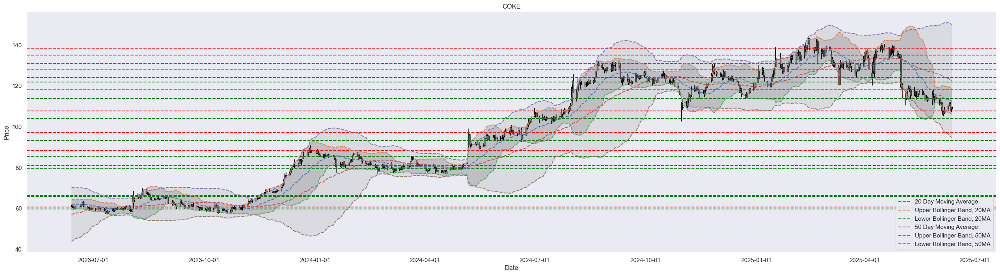

In [13]:
# 6/12/2025 107.35, 6/5/2025 105.21; 6/20/2024 96.50
# Regression drawback 105.5
stock_name = 'coke'

stock_strategy(stock_name, strategy='daily').output()

print('Regression price since 2010: ', stock_regression(stock_name))
print('Regression price since 2020: ', stock_regression(stock_name, regression_start='2020-01-01'))
print('Regression price since QE: ', stock_regression(stock_name, regression_start='2020-03-20'))
stock_strategy(stock_name).latest_metric()
stock_strategy(stock_name).infer_metric()

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


* Current stock price: 464.89
* Recent high: 509.13
* Current stock price is at 91.31% of recent high
Latest 20 Day MA: 484.54
Latest Lower Bollinger Band, 20MA: 467.4
Latest Higher Bollinger Band, 20MA: 501.68
Latest 50 Day MA: 463.98
Latest Lower Bollinger Band, 50MA: 396.9
Latest Higher Bollinger Band, 50MA: 531.07
Latest 50 Day EMA: 470.76
Latest 120 Day MA: 453.87
Latest 200 Day MA: 456.92
Latest 200 Day EMA: 450.03

Latest RSI: 37.14 
Latest MACD Divergence: -2.03 
50MA crosses 200MA at 1.97
20MA break point: 485.16
20MA Lower Bollinger Band break point: 465.84
20MA Upper Bollinger Band break point: 504.49
50MA break point: 463.8
50MA Lower Bollinger Band break point: 390.49
50MA Upper Bollinger Band break point: 537.12
120MA break point: 453.71
200MA break point: 456.84


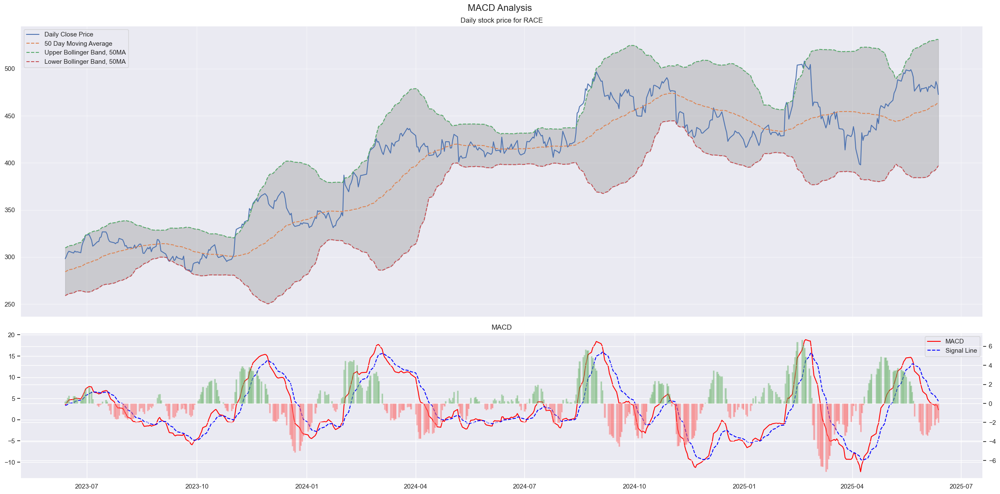

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Regression price since 2010:  487.95
Regression price since 2020:  494.33


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Regression price since QE:  495.89
Current RSI: 41.31 
Current MACD Divergence: -2.76 
Tomorrow inferred RSI: 33.97 
Tomorrow inferred MACD Divergence: -3.11 


In [14]:
# 411 strong supp
# 4/7/2025 min 391.54; 3/27/2025 402.9; 5/8/2024 399.27
stock_name = 'race'

stock_strategy(stock_name).output()

print('Regression price since 2010: ', stock_regression(stock_name))
print('Regression price since 2020: ', stock_regression(stock_name, regression_start='2020-01-01'))
print('Regression price since QE: ', stock_regression(stock_name, regression_start='2020-03-20'))
stock_strategy(stock_name).latest_metric()
stock_strategy(stock_name).infer_metric()

[*********************100%***********************]  1 of 1 completed

* Current stock price: 475.19
* Recent high: 480.42
* Current stock price is at 98.91% of recent high
Latest 20 Day MA: 462.06
Latest Lower Bollinger Band, 20MA: 446.3
Latest Higher Bollinger Band, 20MA: 477.81
Latest 50 Day MA: 423.43
Latest Lower Bollinger Band, 50MA: 322.54
Latest Higher Bollinger Band, 50MA: 524.32
Latest 50 Day EMA: 437.2
Latest 120 Day MA: 415.25
Latest 200 Day MA: 417.8
Latest 200 Day EMA: 417.08

Latest RSI: 77.48 
Latest MACD Divergence: -0.62 



[*********************100%***********************]  1 of 1 completed

50MA crosses 200MA at 103.49
20MA break point: 461.17
20MA Lower Bollinger Band break point: 444.92
20MA Upper Bollinger Band break point: 477.43
50MA break point: 422.3
50MA Lower Bollinger Band break point: 314.11
50MA Upper Bollinger Band break point: 530.49
120MA break point: 414.71
200MA break point: 417.5


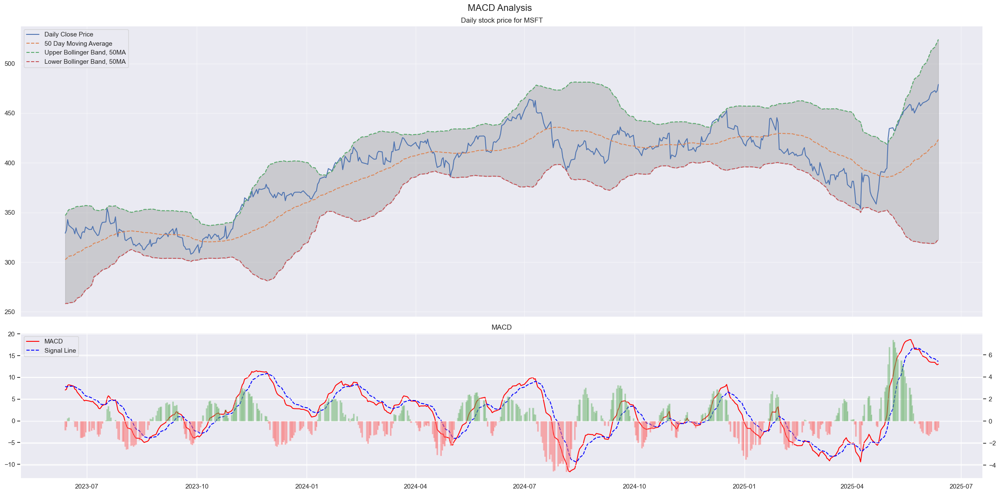

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Regression price since 2010:  491.1
Regression price since 2020:  455.6


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Regression price since QE:  453.42
Current RSI: 79.28 
Current MACD Divergence: -0.76 


[*********************100%***********************]  1 of 1 completed


Tomorrow inferred RSI: 72.52 
Tomorrow inferred MACD Divergence: -0.93 


In [15]:
# 04/07/2025 min 344.79, 04/04/2025 min 362.01 ~ min of plateau 2023Dec - 2024Jan: 362.9
# 368 solid buy based on regression low /0.9/0.95
stock_name = 'msft'

stock_strategy(stock_name).output()

print('Regression price since 2010: ', stock_regression(stock_name))
print('Regression price since 2020: ', stock_regression(stock_name, regression_start='2020-01-01'))
print('Regression price since QE: ', stock_regression(stock_name, regression_start='2020-03-20'))
stock_strategy(stock_name).latest_metric()
stock_strategy(stock_name).infer_metric()

[*********************100%***********************]  1 of 1 completed


* Current stock price: 265.03
* Recent high: 303.0
* Current stock price is at 87.47% of recent high
Latest 20 Day MA: 274.37
Latest Lower Bollinger Band, 20MA: 258.19
Latest Higher Bollinger Band, 20MA: 290.55
Latest 50 Day MA: 270.68
Latest Lower Bollinger Band, 50MA: 242.32
Latest Higher Bollinger Band, 50MA: 299.03
Latest 50 Day EMA: 272.2
Latest 120 Day MA: 269.17
Latest 200 Day MA: 252.01
Latest 200 Day EMA: 257.33

Latest RSI: 44.16 
Latest MACD Divergence: -0.76 


[*********************100%***********************]  1 of 1 completed

20MA crosses 50MA at 147.14
20MA break point: 274.58
20MA Lower Bollinger Band break point: 255.41
20MA Upper Bollinger Band break point: 293.76
50MA break point: 270.68
50MA Lower Bollinger Band break point: 239.66
50MA Upper Bollinger Band break point: 301.71
120MA break point: 269.16
200MA break point: 251.92


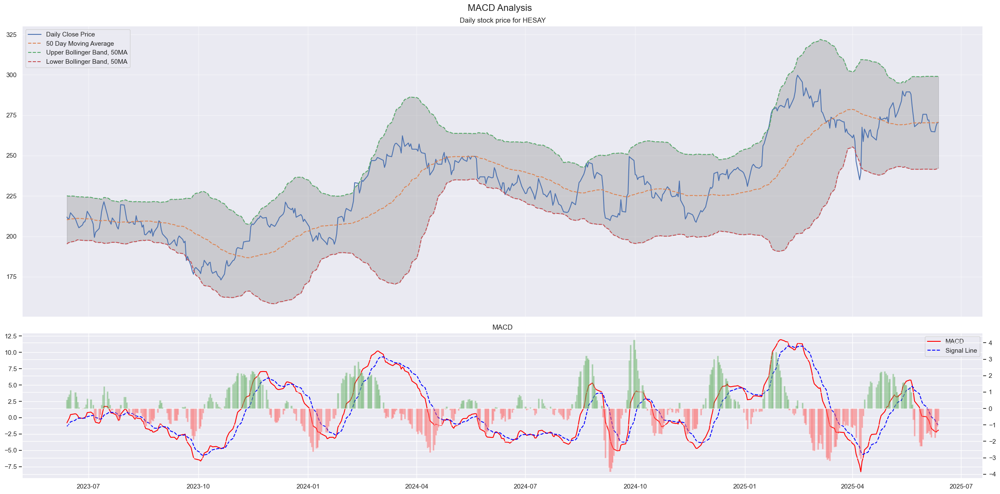

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Regression price since 2010:  283.31
Regression price since 2020:  286.05


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Regression price since QE:  284.86
Current RSI: 45.37 
Current MACD Divergence: -0.85 
Tomorrow inferred RSI: 40.37 
Tomorrow inferred MACD Divergence: -0.84 


In [16]:
# 04/07/2025 min 232.01 then 1/3/2025 228.82
# 228 maximal drawback / 0.9
# 235.8 good support
stock_name = 'hesay'

stock_strategy(stock_name).output()

print('Regression price since 2010: ', stock_regression(stock_name))
print('Regression price since 2020: ', stock_regression(stock_name, regression_start='2020-01-01'))
print('Regression price since QE: ', stock_regression(stock_name, regression_start='2020-03-20'))
stock_strategy(stock_name).latest_metric()
stock_strategy(stock_name).infer_metric()

[*********************100%***********************]  1 of 1 completed


* Current stock price: 289.09
* Recent high: 325.19
* Current stock price is at 88.9% of recent high
Latest 20 Day MA: 295.75
Latest Lower Bollinger Band, 20MA: 286.04
Latest Higher Bollinger Band, 20MA: 305.45
Latest 50 Day MA: 276.87
Latest Lower Bollinger Band, 50MA: 223.26
Latest Higher Bollinger Band, 50MA: 330.49
Latest 50 Day EMA: 286.19
Latest 120 Day MA: 287.12
Latest 200 Day MA: 282.52
Latest 200 Day EMA: 274.56

Latest RSI: 67.97 
Latest MACD Divergence: -0.62 


[*********************100%***********************]  1 of 1 completed


50MA crosses 200MA at 674.61
20MA break point: 295.63
20MA Lower Bollinger Band break point: 284.12
20MA Upper Bollinger Band break point: 307.14
50MA break point: 276.44
50MA Lower Bollinger Band break point: 218.38
50MA Upper Bollinger Band break point: 334.5
120MA break point: 287.03
200MA break point: 282.44


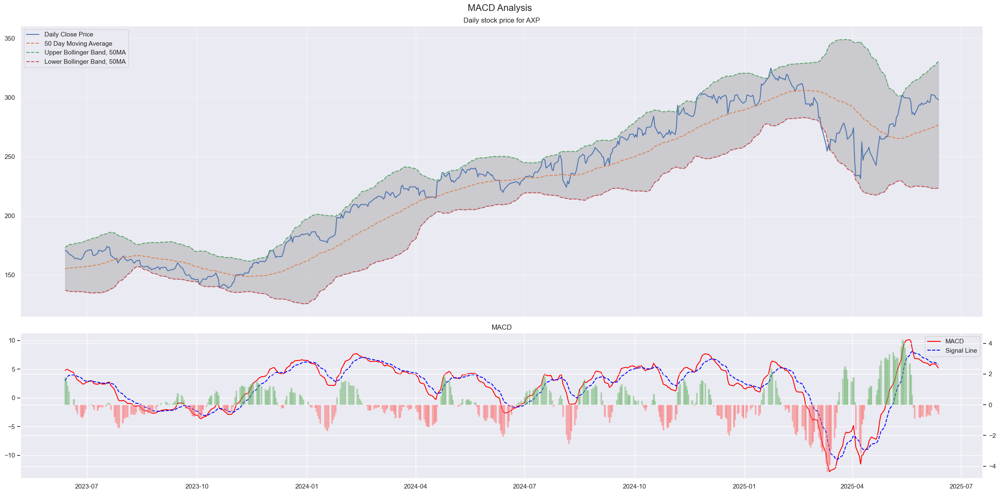

[*********************100%***********************]  1 of 1 completed


Regression price since 2010:  255.04


[*********************100%***********************]  1 of 1 completed


Regression price since 2020:  284.46


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Regression price since QE:  286.07
Current RSI: 55.23 
Current MACD Divergence: -1.32 


[*********************100%***********************]  1 of 1 completed


Tomorrow inferred RSI: 41.8 
Tomorrow inferred MACD Divergence: -1.74 


In [17]:
# 4/7/2025 220.43; 4/4/2025 228.62; 8/5/2024 222.03
# 213.6 can be considered as a bottom based on maximal drawback
# 224.8 based on on maximal drawback () /0.95
# buy below 232
stock_name = 'axp'

stock_strategy(stock_name).output()

print('Regression price since 2010: ', stock_regression(stock_name))
print('Regression price since 2020: ', stock_regression(stock_name, regression_start='2020-01-01'))
print('Regression price since QE: ', stock_regression(stock_name, regression_start='2020-03-20'))
stock_strategy(stock_name).latest_metric()
stock_strategy(stock_name).infer_metric()

[*********************100%***********************]  1 of 1 completed

* Current stock price: 176.16
* Recent high: 206.56
* Current stock price is at 85.28% of recent high
Latest 20 Day MA: 170.35
Latest Lower Bollinger Band, 20MA: 161.61
Latest Higher Bollinger Band, 20MA: 179.1
Latest 50 Day MA: 161.69
Latest Lower Bollinger Band, 50MA: 139.66
Latest Higher Bollinger Band, 50MA: 183.73
Latest 50 Day EMA: 166.86
Latest 120 Day MA: 173.53
Latest 200 Day MA: 171.15
Latest 200 Day EMA: 168.19

Latest RSI: 58.67 
Latest MACD Divergence: 0.55 



[*********************100%***********************]  1 of 1 completed

50MA crosses 200MA at 806.02
20MA break point: 170.07
20MA Lower Bollinger Band break point: 160.08
20MA Upper Bollinger Band break point: 180.07
50MA break point: 161.41
50MA Lower Bollinger Band break point: 137.94
50MA Upper Bollinger Band break point: 184.87
120MA break point: 173.52
200MA break point: 171.12


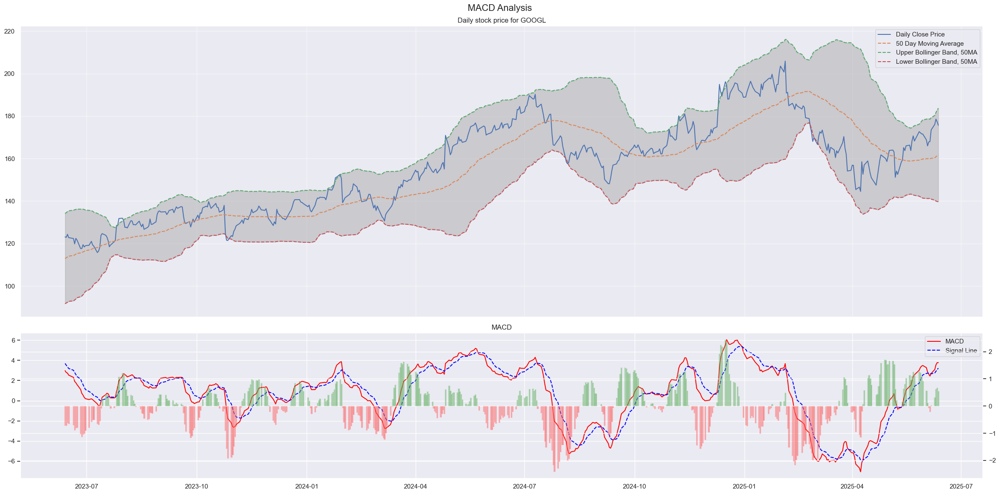

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Regression price since 2010:  186.25
Regression price since 2020:  178.7


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Regression price since QE:  177.69
Current RSI: 64.58 
Current MACD Divergence: 0.44 
Tomorrow inferred RSI: 57.68 
Tomorrow inferred MACD Divergence: 0.31 


In [18]:
# 4/7/2025 min 140.53; 4/4/2025 146.15 & 9/9/2024 147.22 -- strong supp; then 3/5/2024 130.67
# buy 146.2
stock_name = 'googl'

stock_strategy(stock_name).output()

print('Regression price since 2010: ', stock_regression(stock_name))
print('Regression price since 2020: ', stock_regression(stock_name, regression_start='2020-01-01'))
print('Regression price since QE: ', stock_regression(stock_name, regression_start='2020-03-20'))
stock_strategy(stock_name).latest_metric()
stock_strategy(stock_name).infer_metric()

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

* Current stock price: 191.45
* Recent high: 216.66
* Current stock price is at 88.36% of recent high
Latest 20 Day MA: 186.29
Latest Lower Bollinger Band, 20MA: 180.09
Latest Higher Bollinger Band, 20MA: 192.5
Latest 50 Day MA: 185.07
Latest Lower Bollinger Band, 50MA: 166.14
Latest Higher Bollinger Band, 50MA: 204.0
Latest 50 Day EMA: 187.91
Latest 120 Day MA: 188.02
Latest 200 Day MA: 186.41
Latest 200 Day EMA: 184.04

Latest RSI: 79.98 
Latest MACD Divergence: 0.87 
20MA crosses 50MA at 151.63
50MA crosses 200MA at 281.54
20MA break point: 185.97
20MA Lower Bollinger Band break point: 179.41
20MA Upper Bollinger Band break point: 192.53
50MA break point: 184.92
50MA Lower Bollinger Band break point: 164.41
50MA Upper Bollinger Band break point: 205.43
120MA break point: 187.98
200MA break point: 186.38


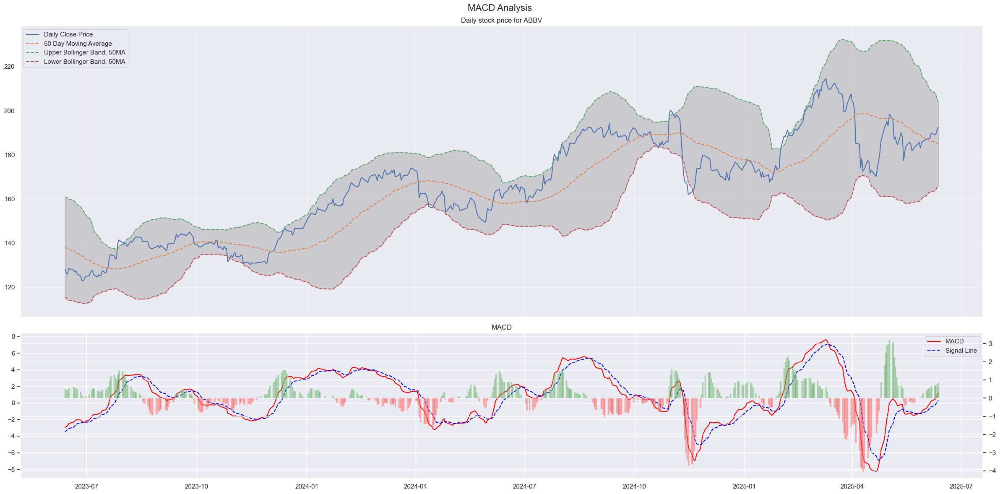

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Regression price since 2010:  197.13
Regression price since 2020:  201.19


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Regression price since QE:  200.62
Current RSI: 74.45 
Current MACD Divergence: 0.8 
Tomorrow inferred RSI: 70.05 
Tomorrow inferred MACD Divergence: 0.71 


In [19]:
# 4/9/2025 min 164.39 - maximal drawback minimal, then 11/19/2024 163.8 -- regression drawback
stock_name = 'abbv'

stock_strategy(stock_name).output()

print('Regression price since 2010: ', stock_regression(stock_name))
print('Regression price since 2020: ', stock_regression(stock_name, regression_start='2020-01-01'))
print('Regression price since QE: ', stock_regression(stock_name, regression_start='2020-03-20'))
stock_strategy(stock_name).latest_metric()
stock_strategy(stock_name).infer_metric()

[*********************100%***********************]  1 of 1 completed


* Current stock price:

[*********************100%***********************]  1 of 1 completed

 818.55
* Recent high: 967.27
* Current stock price is at 84.61999999999999% of recent high
Latest 20 Day MA: 752.54
Latest Lower Bollinger Band, 20MA: 691.12
Latest Higher Bollinger Band, 20MA: 813.96
Latest 50 Day MA: 773.33
Latest Lower Bollinger Band, 50MA: 648.08
Latest Higher Bollinger Band, 50MA: 898.57
Latest 50 Day EMA: 777.96
Latest 120 Day MA: 801.93
Latest 200 Day MA: 824.74
Latest 200 Day EMA: 799.02

Latest RSI: 93.31 
Latest MACD Divergence: 11.18 
20MA crosses 50MA at 1504.8
50MA crosses 200MA at 4239.46
20MA break point: 749.41
20MA Lower Bollinger Band break point: 684.19
20MA Upper Bollinger Band break point: 814.63
50MA break point: 772.54
50MA Lower Bollinger Band break point: 636.36
50MA Upper Bollinger Band break point: 908.71
120MA break point: 801.85
200MA break point: 824.8


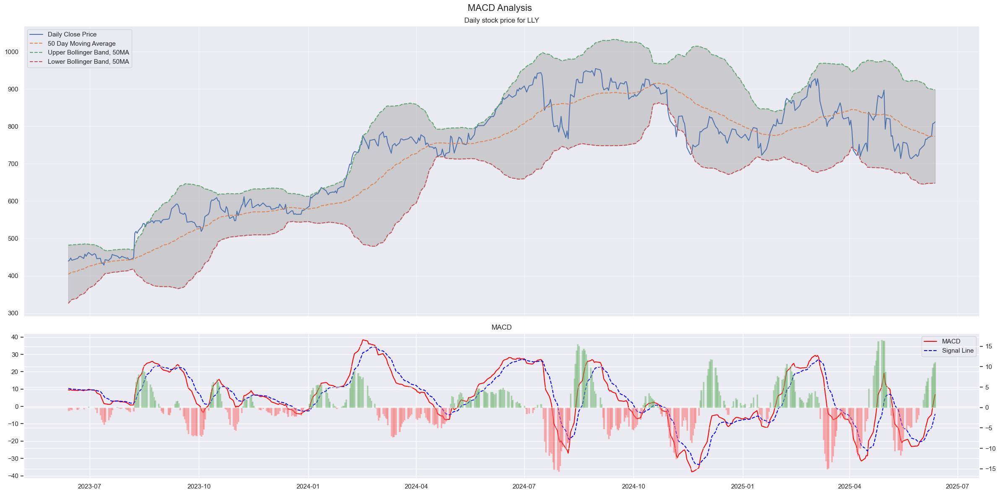

[*********************100%***********************]  1 of 1 completed


Regression price since 2010:  979.77


[*********************100%***********************]  1 of 1 completed


Regression price since 2020:  1001.98


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Regression price since QE:  1001.94
Current RSI: 94.87 
Current MACD Divergence: 11.27 


[*********************100%***********************]  1 of 1 completed


Tomorrow inferred RSI: 94.31 
Tomorrow inferred MACD Divergence: 10.74 


In [20]:
# 697.33 regression drawback
# 4/7/2025 min 677.09 - biggest drawback since 2010, maximal regression drawback since 2010
stock_name = 'lly'

stock_strategy(stock_name).output()

print('Regression price since 2010: ', stock_regression(stock_name))
print('Regression price since 2020: ', stock_regression(stock_name, regression_start='2020-01-01'))
print('Regression price since QE: ', stock_regression(stock_name, regression_start='2020-03-20'))
stock_strategy(stock_name).latest_metric()
stock_strategy(stock_name).infer_metric()

[*********************100%***********************]  1 of 1 completed


* Current stock price: 561.0
* Recent high: 594.71
* Current stock price is at 94.33% of recent high
Latest 20 Day MA: 581.34
Latest Lower Bollinger Band, 20MA: 566.5
Latest Higher Bollinger Band, 20MA: 596.19
Latest 50 Day MA: 553.11
Latest Lower Bollinger Band, 50MA: 472.8
Latest Higher Bollinger Band, 50MA: 633.41
Latest 50 Day EMA: 564.54
Latest 120 Day MA: 546.27
Latest 200 Day MA: 529.82
Latest 200 Day EMA: 528.83

Latest RSI: 67.24 
Latest MACD Divergence: -0.47 


[*********************100%***********************]  1 of 1 completed

20MA break point: 580.93
20MA Lower Bollinger Band break point: 563.79
20MA Upper Bollinger Band break point: 598.06
50MA break point: 552.37
50MA Lower Bollinger Band break point: 465.68
50MA Upper Bollinger Band break point: 639.06
120MA break point: 545.91
200MA break point: 529.52


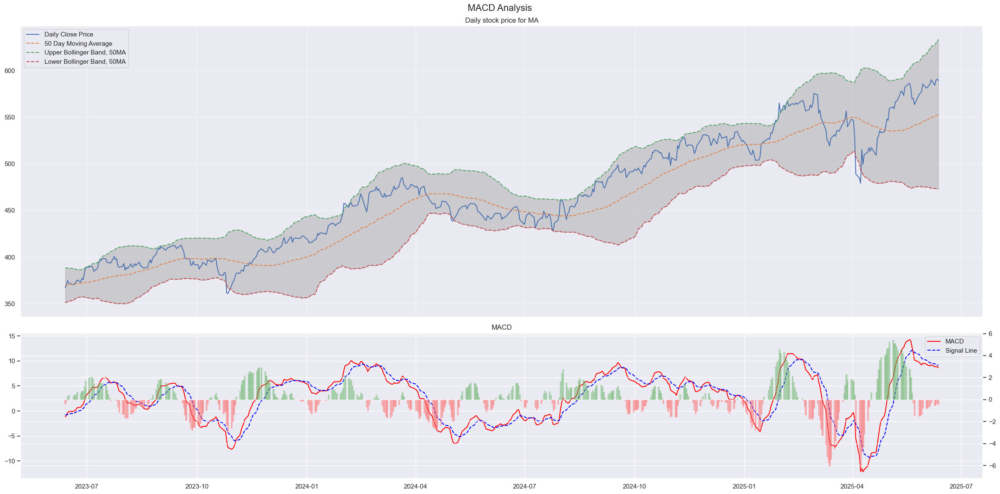

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Regression price since 2010:  574.15
Regression price since 2020:  521.32


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Regression price since QE:  523.45
Current RSI: 48.33 
Current MACD Divergence: -2.39 
Tomorrow inferred RSI: 39.78 
Tomorrow inferred MACD Divergence: -3.55 


In [21]:
stock_name = 'ma'

stock_strategy(stock_name).output()

print('Regression price since 2010: ', stock_regression(stock_name))
print('Regression price since 2020: ', stock_regression(stock_name, regression_start='2020-01-01'))
print('Regression price since QE: ', stock_regression(stock_name, regression_start='2020-03-20'))
stock_strategy(stock_name).latest_metric()
stock_strategy(stock_name).infer_metric()

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

* Current stock price: 145.51
* Recent high: 142.06
* Current stock price is at 102.42999999999999% of recent high
Latest 20 Day MA: 136.75
Latest Lower Bollinger Band, 20MA: 131.13
Latest Higher Bollinger Band, 20MA: 142.36
Latest 50 Day MA: 130.18
Latest Lower Bollinger Band, 50MA: 113.5
Latest Higher Bollinger Band, 50MA: 146.87
Latest 50 Day EMA: 132.56
Latest 120 Day MA: 126.87
Latest 200 Day MA: 123.89
Latest 200 Day EMA: 122.91

Latest RSI: 70.05 
Latest MACD Divergence: 0.29 
20MA break point: 136.52
20MA Lower Bollinger Band break point: 130.26
20MA Upper Bollinger Band break point: 142.79
50MA break point: 129.96
50MA Lower Bollinger Band break point: 112.21
50MA Upper Bollinger Band break point: 147.72
120MA break point: 126.75
200MA break point: 123.8


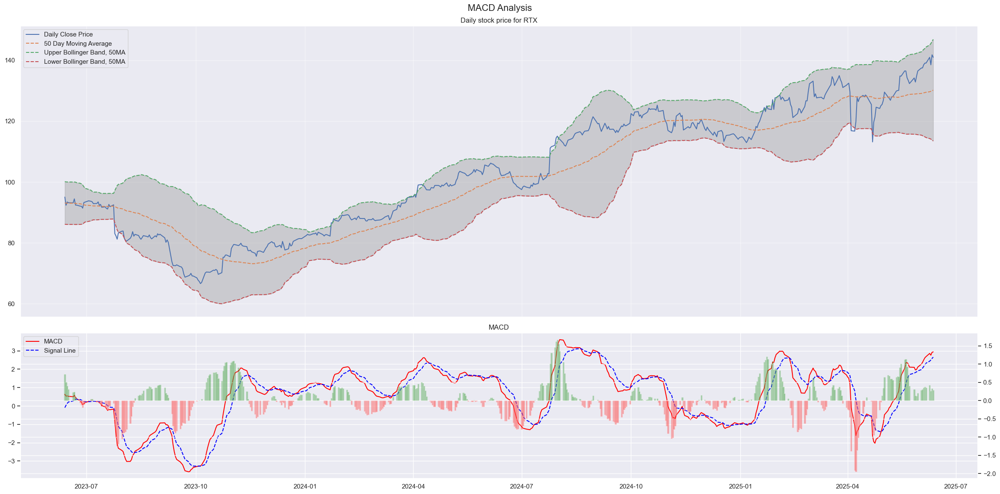

[*********************100%***********************]  1 of 1 completed


Regression price since 2010:  110.03


[*********************100%***********************]  1 of 1 completed


Regression price since 2020:  122.0


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Regression price since QE:  123.57


[*********************100%***********************]  1 of 1 completed

Current RSI: 79.35 
Current MACD Divergence: 0.51 


Tomorrow inferred RSI: 77.51 
Tomorrow inferred MACD Divergence: 0.59 


In [22]:
stock_name = 'rtx'

stock_strategy(stock_name).output()

print('Regression price since 2010: ', stock_regression(stock_name))
print('Regression price since 2020: ', stock_regression(stock_name, regression_start='2020-01-01'))
print('Regression price since QE: ', stock_regression(stock_name, regression_start='2020-03-20'))
stock_strategy(stock_name).latest_metric()
stock_strategy(stock_name).infer_metric()

In [23]:
# # 11/21/2024 low 52.89, 12/30 low 52.53 then 6/4/2024 50.84
# stock_name = 'inda'

# stock_strategy(stock_name).output()

# print('Regression price since 2010: ', stock_regression(stock_name))
# print('Regression price since 2020: ', stock_regression(stock_name, regression_start='2020-01-01'))
# print('Regression price since QE: ', stock_regression(stock_name, regression_start='2020-03-20'))
# stock_strategy(stock_name).latest_metric()
# stock_strategy(stock_name).infer_metric()

#### Return limited; buy low only

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

* Current stock price: 161.18
* Recent high: 178.88
* Current stock price is at 90.11% of recent high
Latest 20 Day MA: 165.2
Latest Lower Bollinger Band, 20MA: 160.61
Latest Higher Bollinger Band, 20MA: 169.8
Latest 50 Day MA: 163.64
Latest Lower Bollinger Band, 50MA: 154.61
Latest Higher Bollinger Band, 50MA: 172.67
Latest 50 Day EMA: 164.38
Latest 120 Day MA: 165.2
Latest 200 Day MA: 166.7
Latest 200 Day EMA: 164.54

Latest RSI: 44.72 
Latest MACD Divergence: -0.49 
20MA crosses 50MA at 110.93
50MA crosses 200MA at 367.34
20MA break point: 165.31
20MA Lower Bollinger Band break point: 159.95
20MA Upper Bollinger Band break point: 170.67
50MA break point: 163.65
50MA Lower Bollinger Band break point: 153.77
50MA Upper Bollinger Band break point: 173.52
120MA break point: 165.22
200MA break point: 166.72


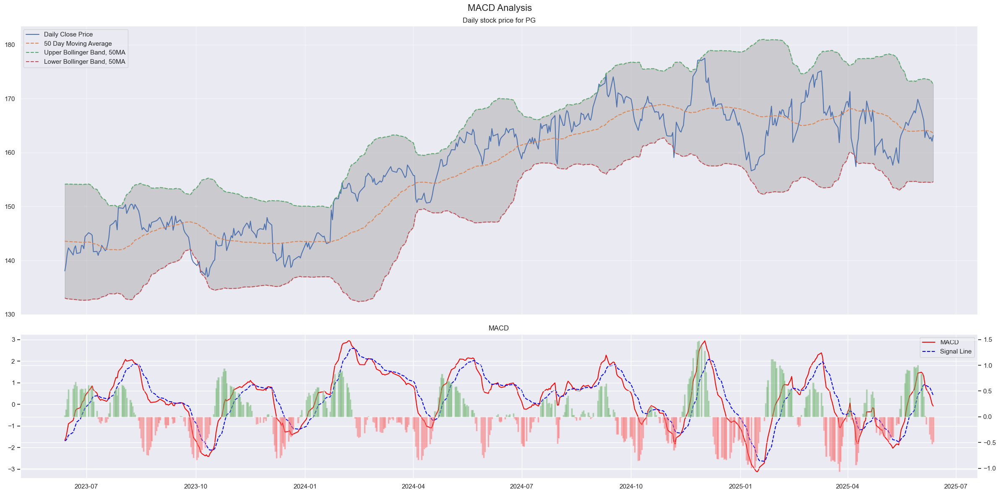

[*********************100%***********************]  1 of 1 completed


Regression price since 2010:  177.47


[*********************100%***********************]  1 of 1 completed


Regression price since 2020:  171.01


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Regression price since QE:  170.69


[*********************100%***********************]  1 of 1 completed


Current RSI: 37.46 
Current MACD Divergence: -0.58 
Tomorrow inferred RSI: 30.38 
Tomorrow inferred MACD Divergence: -0.6 


In [24]:
# only buy at least 4% below regression
# 4/24/2025 min 156.58 -> 4/5/2024 154.69
# 156 - 157 good support
stock_name = 'pg'

stock_strategy(stock_name).output()

print('Regression price since 2010: ', stock_regression(stock_name))
print('Regression price since 2020: ', stock_regression(stock_name, regression_start='2020-01-01'))
print('Regression price since QE: ', stock_regression(stock_name, regression_start='2020-03-20'))
stock_strategy(stock_name).latest_metric()
stock_strategy(stock_name).infer_metric()

[*********************100%***********************]  1 of 1 completed

* Current stock price: 81.26
* Recent high: 83.91
* Current stock price is at 96.85000000000001% of recent high
Latest 20 Day MA: 81.98
Latest Lower Bollinger Band, 20MA: 80.93
Latest Higher Bollinger Band, 20MA: 83.02
Latest 50 Day MA: 81.19
Latest Lower Bollinger Band, 50MA: 78.01
Latest Higher Bollinger Band, 50MA: 84.37
Latest 50 Day EMA: 81.35
Latest 120 Day MA: 80.13
Latest 200 Day MA: 80.41
Latest 200 Day EMA: 79.67

Latest RSI: 56.04 
Latest MACD Divergence: -0.09 



[*********************100%***********************]  1 of 1 completed

20MA crosses 50MA at 55.85
50MA crosses 200MA at 29.86
20MA break point: 81.98
20MA Lower Bollinger Band break point: 80.73
20MA Upper Bollinger Band break point: 83.23
50MA break point: 81.18
50MA Lower Bollinger Band break point: 77.71
50MA Upper Bollinger Band break point: 84.64
120MA break point: 80.12
200MA break point: 80.4


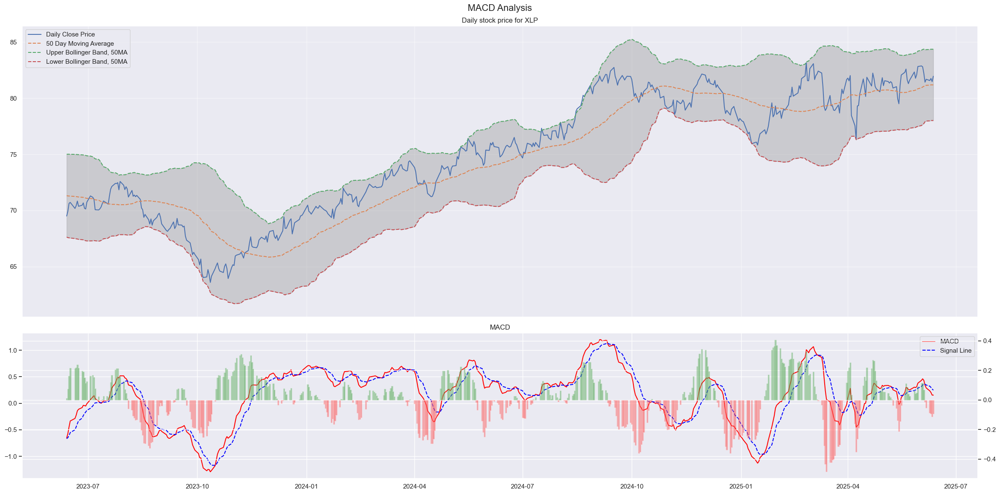

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Regression price since 2010:  84.92
Regression price since 2020:  81.81


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Regression price since QE:  81.69
Current RSI: 47.18 
Current MACD Divergence: -0.12 


Tomorrow inferred RSI: 39.53 
Tomorrow inferred MACD Divergence: -0.13 


In [25]:
# return limited; at least 5% below regression

stock_name = 'xlp'

stock_strategy(stock_name).output()

print('Regression price since 2010: ', stock_regression(stock_name))
print('Regression price since 2020: ', stock_regression(stock_name, regression_start='2020-01-01'))
print('Regression price since QE: ', stock_regression(stock_name, regression_start='2020-03-20'))
stock_strategy(stock_name).latest_metric()
stock_strategy(stock_name).infer_metric()

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

* Current stock price: 484.77
* Recent high: 606.41
* Current stock price is at 79.94% of recent high
Latest 20 Day MA: 472.19
Latest Lower Bollinger Band, 20MA: 457.56
Latest Higher Bollinger Band, 20MA: 486.82
Latest 50 Day MA: 465.99
Latest Lower Bollinger Band, 50MA: 436.04
Latest Higher Bollinger Band, 50MA: 495.94
Latest 50 Day EMA: 467.59
Latest 120 Day MA: 461.31
Latest 200 Day MA: 496.28
Latest 200 Day EMA: 475.1

Latest RSI: 51.31 
Latest MACD Divergence: -1.3 
20MA crosses 50MA at 262.52
50MA crosses 200MA at 2488.93
20MA break point: 472.35
20MA Lower Bollinger Band break point: 454.97
20MA Upper Bollinger Band break point: 489.72
50MA break point: 465.92
50MA Lower Bollinger Band break point: 433.18
50MA Upper Bollinger Band break point: 498.66
120MA break point: 461.24
200MA break point: 496.42


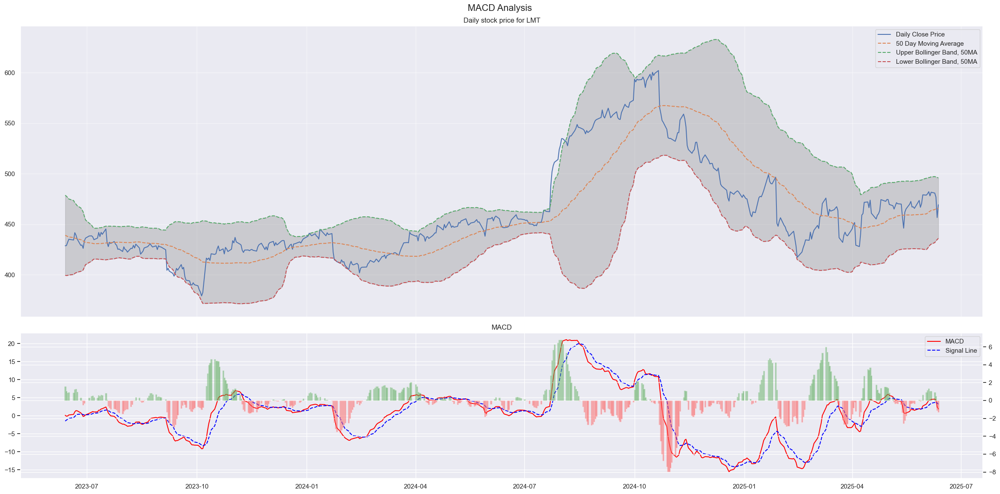

[*********************100%***********************]  1 of 1 completed


Regression price since 2010:  552.91


[*********************100%***********************]  1 of 1 completed


Regression price since 2020:  509.28


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Regression price since QE:  512.73
Current RSI: 60.4 
Current MACD Divergence: -0.39 


[*********************100%***********************]  1 of 1 completed


Tomorrow inferred RSI: 56.66 
Tomorrow inferred MACD Divergence: 0.17 


In [26]:
# 423 (425 supp) regression drawdown lower bound
# 02/14/2025 min 419.70 -> 10/06/2023 min 393.77

stock_name = 'lmt'

stock_strategy(stock_name).output()

print('Regression price since 2010: ', stock_regression(stock_name))
print('Regression price since 2020: ', stock_regression(stock_name, regression_start='2020-01-01'))
print('Regression price since QE: ', stock_regression(stock_name, regression_start='2020-03-20'))
stock_strategy(stock_name).latest_metric()
stock_strategy(stock_name).infer_metric()

## Swing

fico, nvda, tsla, ftbc not regressive

[*********************100%***********************]  1 of 1 completed


* Current stock price: 358.52
* Recent high: 414.97
* Current stock price is at 86.4% of recent high
Latest 20 Day MA: 351.19
Latest Lower Bollinger Band, 20MA: 339.98
Latest Higher Bollinger Band, 20MA: 362.4
Latest 50 Day MA: 325.08
Latest Lower Bollinger Band, 50MA: 257.76
Latest Higher Bollinger Band, 50MA: 392.4
Latest 50 Day EMA: 339.14
Latest 120 Day MA: 342.43
Latest 200 Day MA: 356.09
Latest 200 Day EMA: 342.46

Latest RSI: 68.38 
Latest MACD Divergence: 0.17 


[*********************100%***********************]  1 of 1 completed


50MA crosses 200MA at 2427.77
20MA break point: 350.68
20MA Lower Bollinger Band break point: 338.48
20MA Upper Bollinger Band break point: 362.87
50MA break point: 324.35
50MA Lower Bollinger Band break point: 252.07
50MA Upper Bollinger Band break point: 396.63
120MA break point: 342.28
200MA break point: 356.06


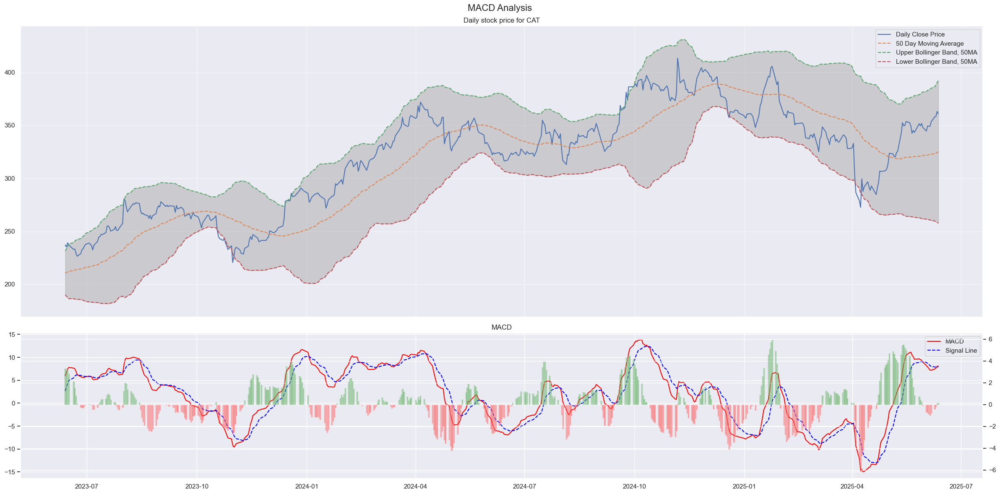

[*********************100%***********************]  1 of 1 completed


Regression price since 2010:  355.53


[*********************100%***********************]  1 of 1 completed


Regression price since 2020:  384.49


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Regression price since QE:  383.71


[*********************100%***********************]  1 of 1 completed

Current RSI: 67.38 
Current MACD Divergence: -0.05 


Tomorrow inferred RSI: 59.9 
Tomorrow inferred MACD Divergence: -0.27 


In [27]:
# 4/3/2025 lowest 308.53, then 8/2/2024 307.05
# 307 - 319 is a support region
# 271.4 can be considered a bottom based on maximal drawback
# 317 - maximal drawback / 0.9 /0.95; 314 - regression drawback /0.9/0.95
stock_name = 'cat'

stock_strategy(stock_name).output()

print('Regression price since 2010: ', stock_regression(stock_name))
print('Regression price since 2020: ', stock_regression(stock_name, regression_start='2020-01-01'))
print('Regression price since QE: ', stock_regression(stock_name, regression_start='2020-03-20'))
stock_strategy(stock_name).latest_metric()
stock_strategy(stock_name).infer_metric()

[*********************100%***********************]  1 of 1 completed

* Current stock price: 90.57
* Recent high: 129.75
* Current stock price is at 69.8% of recent high
Latest 20 Day MA: 91.57
Latest Lower Bollinger Band, 20MA: 87.59
Latest Higher Bollinger Band, 20MA: 95.56
Latest 50 Day MA: 91.35
Latest Lower Bollinger Band, 50MA: 85.53
Latest Higher Bollinger Band, 50MA: 97.17
Latest 50 Day EMA: 92.76
Latest 120 Day MA: 97.51
Latest 200 Day MA: 106.99
Latest 200 Day EMA: 100.79

Latest RSI: 58.58 
Latest MACD Divergence: 0.34 



[*********************100%***********************]  1 of 1 completed

20MA crosses 50MA at 85.55
50MA crosses 200MA at 1135.94
20MA break point: 91.5
20MA Lower Bollinger Band break point: 86.81
20MA Upper Bollinger Band break point: 96.18
50MA break point: 91.31
50MA Lower Bollinger Band break point: 84.98
50MA Upper Bollinger Band break point: 97.64
120MA break point: 97.55
200MA break point: 107.06


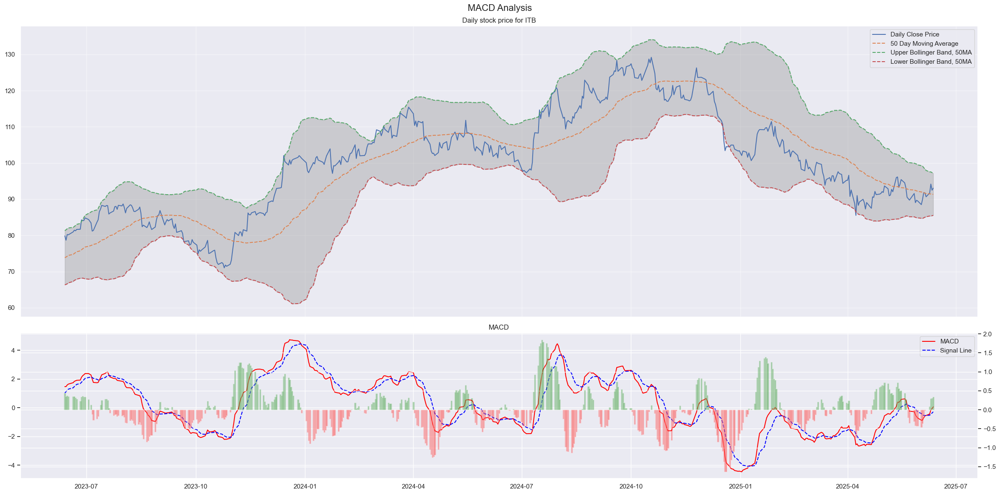

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Regression price since 2010:  111.88


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Regression price since 2020:  115.29
Regression price since QE:  115.13



[*********************100%***********************]  1 of 1 completed


Current RSI: 52.19 
Current MACD Divergence: 0.19 
Tomorrow inferred RSI: 47.07 
Tomorrow inferred MACD Divergence: 0.08 


In [28]:
stock_name = 'itb'
# 4/3/2025 min 90.05; no other support
# maximal drawback 74.17; regression drawback 79.06

stock_strategy(stock_name).output()

print('Regression price since 2010: ', stock_regression(stock_name))
print('Regression price since 2020: ', stock_regression(stock_name, regression_start='2020-01-01'))
print('Regression price since QE: ', stock_regression(stock_name, regression_start='2020-03-20'))
stock_strategy(stock_name).latest_metric()
stock_strategy(stock_name).infer_metric()

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

* Current stock price: 613.41
* Recent high: 665.56
* Current stock price is at 92.16% of recent high
Latest 20 Day MA: 607.13
Latest Lower Bollinger Band, 20MA: 588.26
Latest Higher Bollinger Band, 20MA: 626.01
Latest 50 Day MA: 561.24
Latest Lower Bollinger Band, 50MA: 440.18
Latest Higher Bollinger Band, 50MA: 682.29
Latest 50 Day EMA: 583.31
Latest 120 Day MA: 579.11
Latest 200 Day MA: 558.77
Latest 200 Day EMA: 548.87

Latest RSI: 71.96 
Latest MACD Divergence: -0.03 
50MA crosses 200MA at 460.56
20MA break point: 606.19
20MA Lower Bollinger Band break point: 586.06
20MA Upper Bollinger Band break point: 626.32
50MA break point: 559.93
50MA Lower Bollinger Band break point: 429.91
50MA Upper Bollinger Band break point: 689.96
120MA break point: 578.72
200MA break point: 558.43


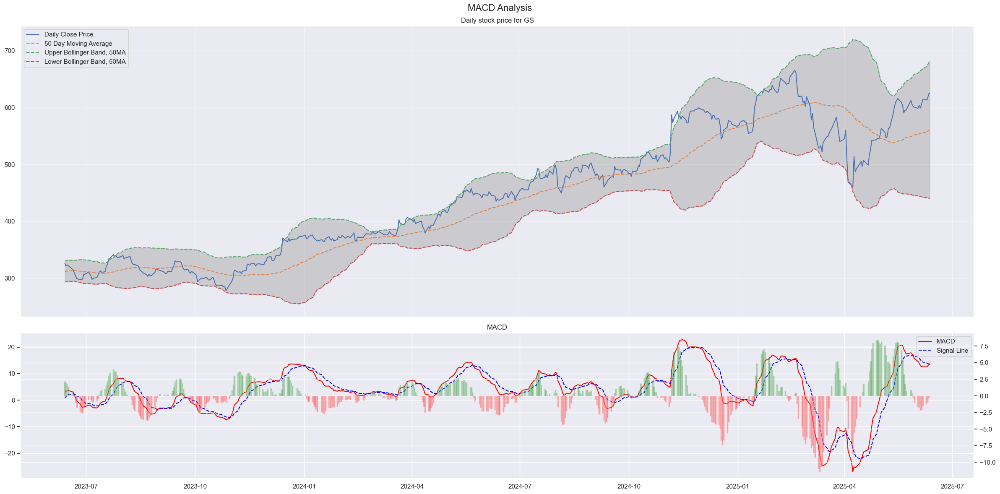

[*********************100%***********************]  1 of 1 completed


Regression price since 2010:  487.66


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Regression price since 2020:  556.85



[*********************100%***********************]  1 of 1 completed


Regression price since QE:  556.91
Current RSI: 61.24 
Current MACD Divergence: -0.67 


[*********************100%***********************]  1 of 1 completed


Tomorrow inferred RSI: 50.59 
Tomorrow inferred MACD Divergence: -1.16 


In [29]:
# 4/7/2025 min 439.38, then 8/5/2024 437.37
stock_name = 'gs'

stock_strategy(stock_name).output()

print('Regression price since 2010: ', stock_regression(stock_name))
print('Regression price since 2020: ', stock_regression(stock_name, regression_start='2020-01-01'))
print('Regression price since QE: ', stock_regression(stock_name, regression_start='2020-03-20'))
stock_strategy(stock_name).latest_metric()
stock_strategy(stock_name).infer_metric()

[*********************100%***********************]  1 of 1 completed

* Current stock price: 50.04
* Recent high: 52.45
* Current stock price is at 95.42% of recent high
Latest 20 Day MA: 50.93
Latest Lower Bollinger Band, 20MA: 50.1
Latest Higher Bollinger Band, 20MA: 51.76
Latest 50 Day MA: 49.15
Latest Lower Bollinger Band, 50MA: 43.84
Latest Higher Bollinger Band, 50MA: 54.47
Latest 50 Day EMA: 50.0
Latest 120 Day MA: 49.51
Latest 200 Day MA: 48.46
Latest 200 Day EMA: 47.85

Latest RSI: 61.49 
Latest MACD Divergence: -0.08 



[*********************100%***********************]  1 of 1 completed

50MA crosses 200MA at 5.02
20MA break point: 50.92
20MA Lower Bollinger Band break point: 49.93
20MA Upper Bollinger Band break point: 51.91
50MA break point: 49.11
50MA Lower Bollinger Band break point: 43.35
50MA Upper Bollinger Band break point: 54.88
120MA break point: 49.49
200MA break point: 48.45


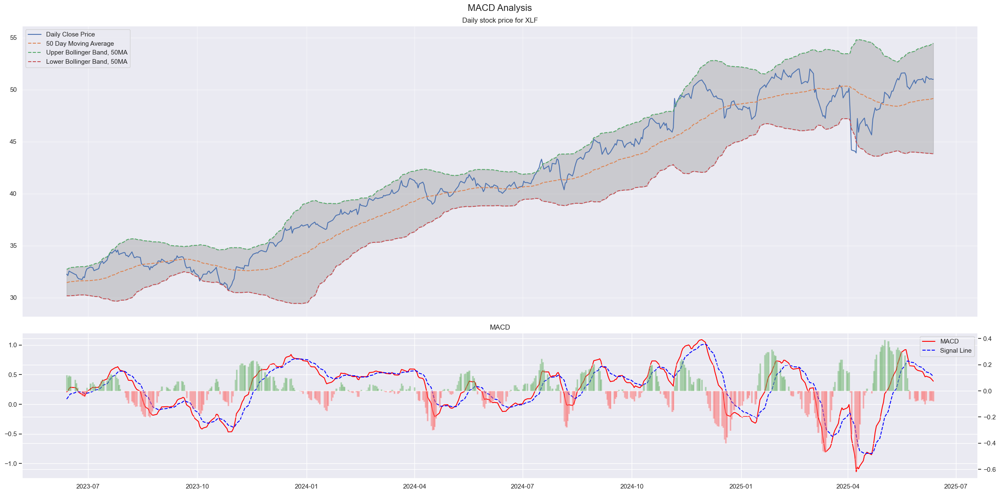

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Regression price since 2010:  46.61
Regression price since 2020:  47.89


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Regression price since QE:  48.03
Current RSI: 49.94 
Current MACD Divergence: -0.14 


Tomorrow inferred RSI: 36.36 
Tomorrow inferred MACD Divergence: -0.18 


In [30]:
# 2025/4/7 min 42.21, then 8/5/2024 40.66
stock_name = 'xlf'

stock_strategy(stock_name).output()

print('Regression price since 2010: ', stock_regression(stock_name))
print('Regression price since 2020: ', stock_regression(stock_name, regression_start='2020-01-01'))
print('Regression price since QE: ', stock_regression(stock_name, regression_start='2020-03-20'))
stock_strategy(stock_name).latest_metric()
stock_strategy(stock_name).infer_metric()

[*********************100%***********************]  1 of 1 completed

* Current stock price: 355.14
* Recent high: 431.63
* Current stock price is at 82.28% of recent high
Latest 20 Day MA: 368.26
Latest Lower Bollinger Band, 20MA: 358.03
Latest Higher Bollinger Band, 20MA: 378.49
Latest 50 Day MA: 360.8
Latest Lower Bollinger Band, 50MA: 336.53
Latest Higher Bollinger Band, 50MA: 385.08
Latest 50 Day EMA: 365.67
Latest 120 Day MA: 375.06
Latest 200 Day MA: 382.87
Latest 200 Day EMA: 370.35

Latest RSI: 49.05 
Latest MACD Divergence: -1.01 



[*********************100%***********************]  1 of 1 completed

20MA crosses 50MA at 114.61
50MA crosses 200MA at 1834.31
20MA break point: 368.53
20MA Lower Bollinger Band break point: 356.66
20MA Upper Bollinger Band break point: 380.4
50MA break point: 360.76
50MA Lower Bollinger Band break point: 334.21
50MA Upper Bollinger Band break point: 387.3
120MA break point: 375.16
200MA break point: 382.97


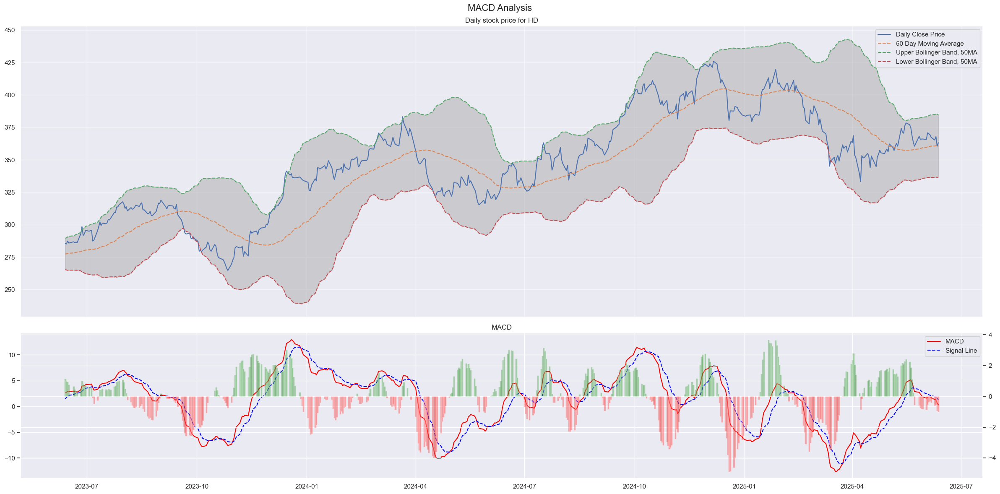

[*********************100%***********************]  1 of 1 completed


Regression price since 2010:  425.65


[*********************100%***********************]  1 of 1 completed


ValueError: attempt to get argmin of an empty sequence

In [31]:
# 3/21/2025 min 346.28, then 3/13/2025 345.26; 8/12/2024 339.37; 6/5/2024 331.64
# BUY 336.2 for maximal drawback /0.9/0.95/0.95; or regression drawback /0.9
stock_name = 'hd'

stock_strategy(stock_name).output()

print('Regression price since 2010: ', stock_regression(stock_name))
print('Regression price since 2020: ', stock_regression(stock_name, regression_start='2020-01-01'))
print('Regression price since QE: ', stock_regression(stock_name, regression_start='2020-03-20'))
stock_strategy(stock_name).latest_metric()
stock_strategy(stock_name).infer_metric()

In [ ]:
# 2025/4/4 min 208.93, then 10/3/2024 204.34
stock_name = 'jpm'

stock_strategy(stock_name).output()

print('Regression price since 2010: ', stock_regression(stock_name))
print('Regression price since 2020: ', stock_regression(stock_name, regression_start='2020-01-01'))
print('Regression price since QE: ', stock_regression(stock_name, regression_start='2020-03-20'))
stock_strategy(stock_name).latest_metric()
stock_strategy(stock_name).infer_metric()

In [ ]:
# 4/4/2025 min 178.23; 1/1/2024 163.97
# supp 200 break
stock_name = 'smh'

stock_strategy(stock_name).output()

print('Regression price since 2010: ', stock_regression(stock_name))
print('Regression price since 2020: ', stock_regression(stock_name, regression_start='2020-01-01'))
print('Regression price since QE: ', stock_regression(stock_name, regression_start='2020-03-20'))
stock_strategy(stock_name).latest_metric()
stock_strategy(stock_name).infer_metric()

In [ ]:
# 2025/4/3 min 48.18
# 47.8 can be considered minimal
stock_name = 'jef'
stock_strategy(stock_name).output()
print('Regression price since 2020: ', stock_regression(stock_name, regression_start='2020-01-01'))
print('Regression price since QE: ', stock_regression(stock_name, regression_start='2020-03-20'))
stock_strategy(stock_name).latest_metric()
stock_strategy(stock_name).infer_metric()

In [ ]:
# 05/09/2025 min 378.54, break all support in 5yrs 
stock_name = 'unh'
# stock_strategy(stock_name).output()
stock_strategy(stock_name, start='2019-01-01', strategy='daily').output()
print('Regression price since 2010: ', stock_regression(stock_name))
print('Regression price since 2020: ', stock_regression(stock_name, regression_start='2020-01-01'))
print('Regression price since QE: ', stock_regression(stock_name, regression_start='2020-03-20'))
stock_strategy(stock_name).latest_metric()
stock_strategy(stock_name).infer_metric()

In [ ]:
# 5/27/2025 min 1484.29
# 1476.58 maximal drawback since QE
stock_name = 'fico'
stock_strategy(stock_name).output()
print('Regression price since QE: ', stock_regression(stock_name, regression_start='2020-03-20'))
stock_strategy(stock_name).latest_metric()
stock_strategy(stock_name).infer_metric()

In [ ]:
# 118 supp?
stock_name = 'nvda'
stock_strategy(stock_name).output()
stock_strategy(stock_name).latest_metric()
stock_strategy(stock_name).infer_metric()

In [ ]:
# # strong supp: 190; 380 break; next support 330
# # Jan/2/2025 min 373.04 - break; next 11-27-2024 326.59, and 11/15/2024 309.22

# stock_name = 'tsla'

# stock_strategy(stock_name).output()
# stock_strategy(stock_name).latest_metric()
# stock_strategy(stock_name).infer_metric()

In [ ]:
# strong supp at 47

stock_name = 'fbtc'

stock_strategy(stock_name).output()
stock_strategy(stock_name).latest_metric()
stock_strategy(stock_name).infer_metric()

## REF

In [ ]:
# 5/14/2025 min 291.97; try 280
# 240 strong supp
stock_name = 'gld'

stock_strategy(stock_name).output()

stock_strategy(stock_name).latest_metric()
stock_strategy(stock_name).infer_metric()

In [ ]:
stock_name = 'xle'

stock_strategy(stock_name).output()
stock_strategy(stock_name).latest_metric()
stock_strategy(stock_name).infer_metric()

## Gamble & Bought, so let's find the right place to sell

In [ ]:
# stock_strategy('pdd').output()
# stock_strategy('pdd').latest_metric()
# stock_strategy('pdd').infer_metric()

In [ ]:
# stock_strategy('anf').output()
# stock_strategy('anf').latest_metric()
# stock_strategy('anf').infer_metric()

In [ ]:
# Very strong supp: (41.6 never reached) - 41.9 - 42.3; 48 strong supp
# 51 strong supp
stock_name = 'fngs'

stock_strategy(stock_name).output()
print('Regression price since 2020: ', stock_regression(stock_name, regression_start='2020-01-01'))
print('Regression price since QE: ', stock_regression(stock_name, regression_start='2020-03-20'))
stock_strategy(stock_name).latest_metric()
stock_strategy(stock_name).infer_metric()

In [ ]:
stock_name = 'dis'

stock_strategy(stock_name).output()
stock_strategy(stock_name).latest_metric()
stock_strategy(stock_name).infer_metric()

In [ ]:
stock_name = 'hpq'

stock_strategy(stock_name).output()
stock_strategy(stock_name).latest_metric()
stock_strategy(stock_name).infer_metric()

In [ ]:
cof_strategy = stock_strategy('cof', start="2021-02-01")
df_check = cof_strategy.return_result()
cof_strategy.output(interactive_plot=True)
print(df_check[df_check['close']>=df_check['Upper Band - 50MA']].shape[0] / df_check.shape[0])
print(df_check[df_check['close']<=df_check['Lower Band - 50MA']].shape[0] / df_check.shape[0])
stock_strategy('cof').latest_metric()
stock_strategy('cof').infer_metric()

In [ ]:
# for stock_name in ['cof', 'brk-b', 'qqq' ,'spy','tqqq', 'upro', 'BTC-USD', 'yinn','inda']:
#     df_stock = stock_strategy(stock_name, start='2021-01-01').return_result()
#     fig, ax = plt.subplots(figsize=(8, 4))
#     ax.grid(True, alpha=0.5)
#     ax.plot(df_stock['date'], df_stock['close'], label='Daily Close Price')
#     # ax.plot(df_stock['date'], df_stock['12 Day EMA'], ls='--', label='12 Day EMA')
#     ax.plot(df_stock['date'], df_stock['26 Day EMA'], ls='--', label='26 Day EMA')
#     ax.plot(df_stock['date'], df_stock['50 Day EMA'], ls='--', label='50 Day EMA')
#     ax.plot(df_stock['date'], df_stock['200 Day EMA'], ls='--', label='200 Day EMA')
#     ax.set_title('Daily stock price and EMAs for ' + stock_name.upper())
#     plt.xticks(rotation=45)
#     ax.legend()
#     plt.show()

## Regression
* Only need to check this weekly - every Tuesday

In [ ]:
# df_brk = yf.download('brk-b'.upper(),
#                  start='2010-01-01',
#                  end=datetime.today())
# df_brk = df_brk.reset_index()
# df_brk['log_price'] = np.log(df_brk['Close'])

# df_brk.head()

In [ ]:
# df_sub = df_brk.reset_index()
# df_sub = df_sub[df_sub['Date']>=pd.to_datetime('2020-01-01')]

# df_sub['days_since_start'] = (df_sub['Date'] - df_sub['Date'].min()).dt.days

# X = df_sub['days_since_start'].values.reshape(-1, 1)  # Feature matrix (date)
# y = np.log10(df_sub['Close']).values.reshape(-1, 1)         # Target vector (price)

# X_b = np.c_[np.ones((len(X), 1)), X]  # Add a bias term (intercept) to feature matrix
# theta_best = np.linalg.inv(X_b.T.dot(X_b)).dot(X_b.T).dot(y)

# intercept, slope = theta_best[0], theta_best[1]

# print('Annual expected return rate: ', 10**(slope*365)-1)
# print('Final price extracted:',10**(intercept + slope*df_sub.tail(1)['days_since_start'].unique()[0]))

# # Generate the fitted curve
# # days_range = np.linspace(df_sub['days_since_start'].min(), df_sub['days_since_start'].max(), 100)
# print("R2:", round(r2_score(y, (intercept + slope*df_sub['days_since_start'])),4))

# fitted_curve = 10**(intercept + slope*df_sub['days_since_start'])

# # Plot the original data and the fitted curve
# plt.figure(figsize=(10, 6))
# plt.scatter(df_sub['Date'], df_sub['Close'], label='Original Data')
# plt.plot(df_sub['Date'], fitted_curve, 'r-', label='Fitted Curve')
# plt.xlabel('Days Since Start')
# plt.ylabel('Price')
# plt.title('Exponential Curve Fitting - Linear')
# plt.legend()
# plt.grid(True)
# plt.show()


In [ ]:
# df_reg = df_brk.reset_index()
# df_reg = df_reg[df_reg['Date']>=pd.to_datetime('2020-01-01')]
# df_reg['days_since_start'] = (df_reg['Date'] - df_reg['Date'].min()).dt.days

# # Assuming your DataFrame is named 'df' and contains columns 'days_since_start' and 'Close'

# # Define the exponential function
# def exponential_func(x, a, b):
#     return a * 10**(b * x)

# # Initial guess for parameters
# initial_guess = (df_reg.head(1)['Close'].unique()[0], np.log10(df_reg.tail(1)['Close'].unique()[0] / df_reg.head(1)['Close'].unique()[0])/df_reg.tail(1)['days_since_start'].unique()[0])  # You might need to adjust these initial values based on your data

# # Fit the curve
# popt, pcov = curve_fit(exponential_func, df_reg['days_since_start'], df_reg['Close'], p0=initial_guess)

# a_fit, b_fit = popt
# print('Annual expected return rate: ', 10**(b_fit*365)-1)
# print('Final price extracted:',exponential_func(df_reg.tail(1)['days_since_start'].unique()[0],a_fit, b_fit))

# # Generate the fitted curve
# # days_range = np.linspace(df_reg['days_since_start'].min(), df_reg['days_since_start'].max(), 100)
# # fitted_curve = exponential_func(days_range, *popt)
# fitted_curve = exponential_func(df_reg['days_since_start'], *popt)
# print("R2:", round(r2_score(np.log10(df_reg['Close']).values.reshape(-1, 1), (np.log10(a_fit) + b_fit*df_reg['days_since_start'])),4))

# index_start = np.where(df_reg['Close'].values >= fitted_curve)[0][0]
# print("Max diff from regression relative to regression price:", ((fitted_curve[index_start:] - df_reg['Close'].values[index_start:]) / fitted_curve[index_start:]).max())
# # Plot the original data and the fitted curve
# plt.figure(figsize=(10, 6))
# plt.scatter(df_reg['Date'], df_reg['Close'], label='Original Data')
# plt.plot(df_reg['Date'], fitted_curve, 'r-', label='Fitted Curve')
# plt.xlabel('Days Since Start')
# plt.ylabel('Price')
# plt.title('Exponential Curve Fitting')
# plt.legend()
# plt.grid(True)
# plt.show()


In [ ]:
new_prices = []
for stock_name in list_base + list_swing + ['gld']:
    new_price = stock_strategy(stock_name).ticker['Close'].tolist()[0]
    new_prices.append(round(new_price,2))
for e in new_prices:
    print(e)

In [ ]:
# for stock_name in [
#     'brk-b',
#     'cost',
#     'voo',
#    # 'ive', -- basically voo + brk-b
#     'abbv',
#     'xlk',
#     'xlv',
#     'unh',
#     'coke',
#     'aapl',
#    # 'fngs',
#     'msft',
#    # 'ixn', -- too high with xlk and voo
#     'race',
#    # 'dia', -- only useful as ref, not gonna buy
#     'hesay',
#    # 'qqqm',
#    # 'qqq', -- has xlk
#     'cat',
#     'axp',
#     'pg',
#    # 'xlp', -- return too low
#     'wmt',
#     'lmt',
#     'inda',
#    # 'v', -- replicate with ma
#     'ma',
#     # 'nvda', # 2010 mess; 2020 bad; QE bad
#     # 'tsla', # not regressive
#     # 'fbtc', # not regressive
#     'smh', # 2010 good, 2020 fair+, QE fair+; -47.63
#     'itb', # 2010 good -55.68, 2020 fair -55.68, QE fair -42.44
#     'googl', # 2010 good -45.01, 2020 fair -45.01, QE fair -45.01
#     'lly', # 2010 mess -30.88, 2020 good -26.85, QE good -26.85
#     'xlf', # 2010 good -44.26, 2020 bad -44.26, QE bad -29.04
#     'jpm', # 2010 good -45.49, 2020 bad -45.49, QE bad -41.44
#     'hd', # 2010 good -43.15, 2020 bad -43.15, QE bad -37.11
#     'fico', # all not good
#     'amzn', # only 2010 good
# ]:
if datetime.today().weekday() == 0:
    for stock_name in list_base + list_swing:
        stock_regression(stock_name, detailed=True)
else:
    pass

In [ ]:
if datetime.today().weekday() == 0:
    for stock_name in list_base + list_swing:
        stock_regression(stock_name, regression_start='2020-01-01', detailed=True)
else:
    pass

In [ ]:
if datetime.today().weekday() == 0:
    for stock_name in list_base + list_swing:
        stock_regression(stock_name, regression_start='2020-03-20', detailed=True)
else:
    pass

In [ ]:
# stock_name = 'gld'
# stock_regression(stock_name, detailed=True) # bad
# stock_regression(stock_name, regression_start='2016-01-01', detailed=True) # good
# stock_regression(stock_name, regression_start='2020-01-01', detailed=True) # bad
# stock_regression(stock_name, regression_start='2020-03-20', detailed=True) # bad

### Check Correlation - only needed if multiple triggered

In [ ]:
# No tsla, fbtc, fngs
stock_list = [e for e in list_base + list_swing if e not in ['tsla', 'fbtc']]
l_dfs = []

for stock_name in stock_list:
    df = yf.download(stock_name.upper(), start='2010-01-01', end=datetime.today().strftime('%Y-%m-%d')).droplevel(level='Ticker', axis=1)
    df = df.reset_index()
    df.columns = df.columns.str.lower()
    df['name'] = stock_name
    l_dfs.append(df[['name', 'date', 'close']])

df_all = pd.concat(l_dfs)
pivot_df = df_all[['date','close', 'name']].pivot(index='date', columns='name', values='close')

correlation_matrix = pivot_df.corr()

high_correlation = correlation_matrix[correlation_matrix >= 0.9]

plt.figure(figsize=(20, 16))
sns.heatmap(high_correlation, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('High Correlation Matrix (>= 0.9) of Daily Stock Prices')
plt.show()    

In [ ]:
pivot_df = df_all[df_all['date']>='2020-01-01'][['date','close', 'name']].pivot(index='date', columns='name', values='close')

correlation_matrix = pivot_df.corr()

high_correlation = correlation_matrix[correlation_matrix >= 0.9]

plt.figure(figsize=(20, 16))
sns.heatmap(high_correlation, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('High Correlation Matrix (>= 0.9) of Daily Stock Prices')
plt.show()

In [ ]:
# pivot_df = df_all[df_all['date']>='2020-03-20'][['date','close', 'name']].pivot(index='date', columns='name', values='close')

# correlation_matrix = pivot_df.corr()

# high_correlation = correlation_matrix[correlation_matrix >= 0.9]

# plt.figure(figsize=(20, 16))
# sns.heatmap(high_correlation, annot=True, cmap='coolwarm', fmt=".2f")
# plt.title('High Correlation Matrix (>= 0.9) of Daily Stock Prices')
# plt.show()

### Gamble - meme stocks

In [ ]:
# import requests
# from bs4 import BeautifulSoup

# # Define URL to scrape
# url = "https://finance.yahoo.com/most-active/"

# # Get the webpage content
# response = requests.get(url)
# response.raise_for_status()  # Raise exception for unsuccessful requests

# # Parse HTML content
# soup = BeautifulSoup(response.content, 'html.parser')

# # Find the container holding stock names (inspect the webpage's HTML)
# all_tables = soup.find_all('table')
# for table in all_tables:
#   # Check for presence of headers containing "Symbol", "Name", "Price" etc.
#   if any(header.text.strip() in ("Symbol", "Name", "Price") for header in table.find_all('th')):
#     stock_table = table
#     break
# stock_names = []
# if stock_table:
#   for row in stock_table.find_all('tr'):
#     name_cell = row.find('td', {'aria-label': 'Symbol'})
#     if name_cell:
#       stock_names.append(name_cell.text.strip())

# # Print the extracted list
# print(stock_names)

In [ ]:
# list_new_meme = [
# "BURU",
# "AITX",
# "STSS",
# "NSAV",
# "HMBL",
# "INKW",
# "NVDA",
# "LGVN",
# "RONN",
# "BRTX",
# "OZSC",
# "NCI",
# "WHEN",
# "IGPK",
# "KYNC",
# "DPLS",
# "ILUS",
# "TSLA",
# "BCAP",
# "CERO",
# "AAPL",
# "CYN",
# "CRKN",
# "MRVL",
# "WKHS",
# "DIDIY",
# "VLD",
# "LTNC",
# "GME",
# "AONC",
# "ENZC"
# ]

In [ ]:
# with open ('../list_meme_static', 'rb') as fp:
#     list_meme_static = pickle.load(fp)
# for e in list_new_meme:
#     if e not in list_meme_static:
#         list_meme_static.append(e)
# list_meme_static = list(set(list_meme_static))
# with open ('../list_meme_static', 'wb') as fp:
#     pickle.dump(list_meme_static, fp)

# with open ('../list_meme_static', 'rb') as fp:
#     list_meme_static = pickle.load(fp)
# print('Static meme stocks:', len(list_meme_static))

In [ ]:
# # we can pull additional meme stock below from https://www.quiverquant.com/scores/memestocks

# import requests
# from bs4 import BeautifulSoup

# def get_stock_names(url):
#   """Extracts stock names from a given URL.

#   Args:
#     url: The URL of the webpage containing the stock names.

#   Returns:
#     A list of stock names.
#   """

#   response = requests.get(url)
#   soup = BeautifulSoup(response.content, 'html.parser')

#   # Find the table containing the stock names
#   table = soup.find('table')

#   # Extract stock names from table rows
#   stock_names = []
#   for row in table.find_all('tr')[1:]:
#     cells = row.find_all('td')
#     if cells:
#       stock_names.append(cells[1].text.strip().split('\n')[0])

#   return stock_names

# # Example usage
# url = 'https://www.quiverquant.com/scores/memestocks'
# stock_names = get_stock_names(url)
# print('Added dynamically:', len(stock_names))

# # list_meme = list(set(stock_names+list_meme_static))
# list_meme = list(set(stock_names+list_new_meme))
# print('All meme stocks:', len(list_meme))


In [ ]:
# obj = stock_strategy('AMC', start=(datetime.today() - relativedelta(months=24)).strftime('%Y-%m-%d'),
#                      end=datetime.today().strftime('%Y-%m-%d'))
# obj.latest_metric(print_result=False)

# print('Volume:', obj.df['volume'].mean(), obj.ticker['Volume'][0], obj.ticker['Volume'][0] / obj.df['volume'].mean())
# print('RSI:', obj.df.tail(1)['RSI'].tolist()[0], obj.curr_rsi)
# print('MACD:', obj.df.tail(1)['MACD_diff'].tolist()[0], obj.curr_macd)
# obj.df.tail(5)

In [ ]:
# dict_meme = dict({'stock_name':[],
#                   'avg_vol':[],
#                   'curr_vol':[],
#                   'vol_ratio':[],
#                   'old_rsi':[],
#                   'old_macd':[],
#                   'curr_rsi':[],
#                   'curr_macd':[],                  
#                  })
# list_to_check1 = []
# list_to_check2 = []

# for e in list_meme:
#     try:
#         obj = stock_strategy(e,
#                              start=(datetime.today() - relativedelta(months=3)).strftime('%Y-%m-%d'),
#                              end=datetime.today().strftime('%Y-%m-%d'))
#         obj.latest_metric(print_result=False)
#         avg_vol = obj.df['volume'].mean()
#         ticker = yf.Ticker(e.upper()).history(period='1d')
#         curr_vol = ticker['Volume'][0]
#         vol_ratio = curr_vol / avg_vol
#         old_rsi = obj.df.tail(1)['RSI'].tolist()[0]
#         old_macd = obj.df.tail(1)['MACD_diff'].tolist()[0]
#         curr_rsi = obj.curr_rsi
#         curr_macd = obj.curr_macd
#         dict_meme['stock_name'].append(e)
#         dict_meme['avg_vol'].append(avg_vol)
#         dict_meme['curr_vol'].append(curr_vol)
#         dict_meme['vol_ratio'].append(vol_ratio)
#         dict_meme['old_rsi'].append(old_rsi)
#         dict_meme['old_macd'].append(old_macd)
#         dict_meme['curr_rsi'].append(curr_rsi)
#         dict_meme['curr_macd'].append(curr_macd)
#         if vol_ratio > 1 and old_rsi < 70 and curr_rsi > 50 and curr_rsi > old_rsi and curr_macd > old_macd and curr_macd > 0:
#             list_to_check1.append(e)
#         if vol_ratio > 1 and curr_rsi > 60 and curr_rsi > old_rsi and curr_macd > old_macd:
#             list_to_check2.append(e)
#     except:
# print(list_to_check1)
# print(list_to_check2)

# df_meme = pd.DataFrame(dict_meme)

In [ ]:
# # for safety, one can have curr_macd > 1.5*old_macd
# df_meme['macd_increase'] = (df_meme['curr_macd'] - df_meme['old_macd'])/df_meme['curr_macd']
# df_meme[df_meme['stock_name'].isin(list_to_check1+list_to_check2)].sort_values(by='macd_increase',ascending=False)

In [ ]:
# df_meme[(df_meme['stock_name'].isin(list_to_check1+list_to_check2)) & (df_meme['curr_macd']>1.5*df_meme['old_macd'])].sort_values(by='vol_ratio', ascending=False)

### Backup only

In [ ]:
# def get_optimum_clusters(df, saturation_point=0.05):
#     '''
#     :param df: dataframe
#     :param saturation_point: The amount of difference we are willing to detect
#     :return: clusters with optimum K centers

#     This method uses elbow method to find the optimum number of K clusters
#     We initialize different K-means with 1..10 centers and compare the inertias
#     If the difference is no more than saturation_point, we choose that as K and move on
#     '''
22221
#     wcss = []wqs
#     k_models = []

#     size = min(11, len(df.index))
#     for i in range(1, size):
#         kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10, random_state=0)
#         kmeans.fit(df)
#         wcss.append(kmeans.inertia_)
#         k_models.append(kmeans)

#     # Compare differences in inertias until it's no more than saturation_point
#     optimum_k = len(wcss)-1
#     for i in range(0, len(wcss)-1):
#         diff = abs(wcss[i+1] - wcss[i])
#         if diff < saturation_point:
#             optimum_k = i
#             break

#     # knee = KneeLocator(range(1, size), wcss, curve='convex', direction='decreasing')
#     # optimum_k = knee.knee

#     optimum_clusters = k_models[optimum_k]

#     return optimum_clusters

# def identify_weak_support_resistance(data):
#     # Initialize an empty list to store the labels (support, resistance, neither)
#     labels = []

#     # Iterate through the dataframe to identify weak support and weak resistance
#     for i in range(len(data)):
#         if i == 0 or i == len(data) - 1:
#             # Edge cases where there's no previous or following day
#             labels.append("neither")
#         elif data['close'][i] < data['close'][i - 1] and data['close'][i] < data['close'][i + 1]:
#             # Weak support condition
#             labels.append("weak support")
#         elif data['close'][i] > data['close'][i - 1] and data['close'][i] > data['close'][i + 1]:
#             # Weak resistance condition
#             labels.append("weak resistance")
#         else:
#             # Neither weak support nor weak resistance
#             labels.append("neither")

#     # Add the labels to a new column in the dataframe
#     data['Support/Resistance'] = labels

#     return data

In [ ]:
# def break_point_solution_bb(stock_name):
#     '''
#     Solve for the break point solution price for breaking the current MA/BB
#     stock_name: str
#     '''
#     df = yf.download(stock_name.upper(),
#                  start=(datetime.today() - relativedelta(days=100)).strftime('%Y-%m-%d'),
#                  end=datetime.today()
#                  )
#     df = df.reset_index()
#     df.columns = df.columns.str.lower()
#     # df = df[['close']]
    
#     # Define the expression whose roots we want to find
#     # fsolve is not satisfying; provide analytical solution
#     last_19day_price = df[df['date'].between(
#         (datetime.today()-relativedelta(days=19)).strftime('%Y-%m-%d'),
#         (datetime.today()-relativedelta(days=1)).strftime('%Y-%m-%d'))]['close']
#     last_49day_price = df[df['date'].between(
#         (datetime.today()-relativedelta(days=49)).strftime('%Y-%m-%d'),
#         (datetime.today()-relativedelta(days=1)).strftime('%Y-%m-%d'))]['close']

#     a1 = np.sum(last_19day_price)
#     a2 = np.sum(last_19day_price**2)
#     p_ma = np.mean(last_19day_price)
#     p_ubb = (562*a1 + np.sqrt((562*a1)**2 - 4*(5339*(99*a1**2-1600*a2))))/5339/2
#     p_lbb = (562*a1 - np.sqrt((562*a1)**2 - 4*(5339*(99*a1**2-1600*a2))))/5339/2
    
#     print('20MA break point:', round(p_ma,2))
#     print('20MA Lower Bollinger Band break point:', round(p_lbb,2))
#     print('20MA Upper Bollinger Band break point:', round(p_ubb,2))

#     a1 = np.sum(last_49day_price)
#     a2 = np.sum(last_49day_price**2)
#     p_ma = np.mean(last_49day_price)
#     p_ubb = (4177*a1 + np.sqrt((4177*a1)**2 - 4*(102336.5*(361.5*a1**2-15625*a2))))/102336.5/2
#     p_lbb = (4177*a1 - np.sqrt((4177*a1)**2 - 4*(102336.5*(361.5*a1**2-15625*a2))))/102336.5/2
    
#     print('50MA break point:', round(p_ma,2))
#     print('50MA Lower Bollinger Band break point:', round(p_lbb,2))
#     print('50MA Upper Bollinger Band break point:', round(p_ubb,2))

In [ ]:
# def plot_stock(stock_name,
#                start=(datetime.today() - relativedelta(years=3)).strftime('%Y-%m-%d'),
#                end=datetime.today(),
#                figsize=(12, 9),
#                interactive=False,
#                return_result=False,
#               ):
#     '''
#     Input:
#     stock_name: str
#     start: datetime
#     end: datetime
#     '''
#     df = yf.download(stock_name.upper(),
#                      start=start,
#                      end=end)
#     df = df.reset_index()
#     df.columns = df.columns.str.lower()

#     df['20 Day MA'] = df['close'].rolling(window=20).mean()
#     df['20 Day STD'] = df['close'].rolling(window=20).std()
#     df['Upper Band - 20MA'] = df['20 Day MA'] + (df['20 Day STD'] * 2)
#     df['Lower Band - 20MA'] = df['20 Day MA'] - (df['20 Day STD'] * 2)
#     df['50 Day MA'] = df['close'].rolling(window=50).mean()
#     df['50 Day STD'] = df['close'].rolling(window=50).std()
#     df['Upper Band - 50MA'] = df['50 Day MA'] + (df['50 Day STD'] * 2.5)
#     df['Lower Band - 50MA'] = df['50 Day MA'] - (df['50 Day STD'] * 2.5)
    
#     yesterday = (datetime.today() - relativedelta(days=1)).strftime('%Y-%m-%d')
#     close = df[df['date']==yesterday]['close'].item()
#     print('* previous stock price closing', round(close,2))
#     print("Latest 20 Day MA:", round(df[df['date']==yesterday]['20 Day MA'].item(), 2))
#     print("Latest Lower Bollinger Band, 20MA:", round(df[df['date']==yesterday]['Lower Band - 20MA'].item(), 2))
#     print("Latest Higher Bollinger Band, 20MA:", round(df[df['date']==yesterday]['Upper Band - 20MA'].item(), 2))
#     print("Latest 50 Day MA:", round(df[df['date']==yesterday]['50 Day MA'].item(), 2))
#     print("Latest Lower Bollinger Band, 50MA:", round(df[df['date']==yesterday]['Lower Band - 50MA'].item(), 2))
#     print("Latest Higher Bollinger Band, 50MA:", round(df[df['date']==yesterday]['Upper Band - 50MA'].item(), 2))
#     print()

#     # Calculate RSI
#     delta = df['close'].diff()
#     gain = (delta.where(delta > 0, 0)).rolling(window=14).mean()
#     loss = (-delta.where(delta < 0, 0)).rolling(window=14).mean()
#     rs = gain / loss
#     df['RSI'] = 100 - (100 / (1 + rs))
#     latest_rsi = round(df[df['date']==yesterday]['RSI'].item(), 2)
#     if latest_rsi > 70:
#         print("Latest RSI:", Fore.RED + str(latest_rsi), Style.RESET_ALL)
#     elif latest_rsi < 30:
#         print("Latest RSI:", Fore.GREEN + str(latest_rsi), Style.RESET_ALL)
#     else:
#         print("Latest RSI:", latest_rsi, Style.RESET_ALL)

#     # Calculate MACD
#     df['12 Day EMA'] = df['close'].ewm(span=12, adjust=False).mean()
#     df['26 Day EMA'] = df['close'].ewm(span=26, adjust=False).mean()
#     df['MACD'] = df['12 Day EMA'] - df['26 Day EMA']
#     df['MACD_signal'] = df['MACD'].ewm(span=9, adjust=False).mean()
#     latest_macd = round(df[df['date']==yesterday]['MACD'].item() - df[df['date']==yesterday]['MACD_signal'].item(), 2)
#     if latest_macd < 0:
#         print("Latest MACD Divergence:", Fore.RED + str(latest_macd), Style.RESET_ALL)
#     elif latest_macd > 0:
#         print("Latest MACD Divergence:", Fore.GREEN + str(latest_macd), Style.RESET_ALL)
#     else:
#         print("Latest MACD Divergence:", Fore.BLACK + str(latest_macd), Style.RESET_ALL)

#     break_point_solution_bb(stock_name)
#     # df = identify_weak_support_resistance(df)
    
#     # low_clusters = get_optimum_clusters(df[df['Support/Resistance']=='weak support'][['date',"close"]].set_index('date'))
#     # low_centers = low_clusters.cluster_centers_
#     # low_centers = np.sort(low_centers, axis=0)
    
#     # high_clusters = get_optimum_clusters(df[df['Support/Resistance']=='weak resistance'][['date',"close"]].set_index('date'))
#     # high_centers = high_clusters.cluster_centers_
#     # high_centers = np.sort(high_centers, axis=0)
    
#     # print('Supports')
#     # print([low[0] for low in low_centers[:]])
#     # print('Resistance')
#     # print([high[0] for high in high_centers[:]])

#     df_plot = df[df['date'] >= df['date'].min() + relativedelta(years=1)]
#     if interactive:
#         fig = go.Figure(layout=dict(width=figsize[0]*80, height=figsize[1]*80))
        
#         fig.add_trace(go.Scatter(x=df_plot['date'], y=df_plot['close'], name='Daily Price'))
#         fig.add_trace(go.Scatter(x=df_plot['date'], y=df_plot['50 Day MA'], mode='lines', line=dict(dash='dash'), name='50 Day MA'))
#         fig.add_trace(go.Scatter(x=df_plot['date'], y=df_plot['Lower Band - 50MA'], mode='lines', line=dict(dash='dash'), name='Lower Band'))
#         fig.add_trace(go.Scatter(x=df_plot['date'], y=df_plot['Upper Band - 50MA'], mode='lines', line=dict(dash='dash'), name='Upper Band', fill='tonexty', fillcolor='rgba(128,128,128,0.3)'))
        
#         # for low in low_centers[:]:
#         #     fig.add_trace(go.Scatter(x=df['date'], y=[low[0]]*len(df['date']), mode='lines', line=dict(color='green', dash='dash'), name='Support at ' + str(low[0])))
#         # for high in high_centers[:]:
#         #     fig.add_trace(go.Scatter(x=df['date'], y=[high[0]]*len(df['date']), mode='lines', line=dict(color='red', dash='dash'), name='Resistance at ' + str(high[0])))        
#         fig.update_layout(title='Interactive Plot of Daily Stock Price for ' + stock_name,
#                           xaxis_title='date',
#                           yaxis_title='Daily Price',
#                           hovermode='closest')
        
#         # Add ability to select a single data point
#         fig.update_traces(marker=dict(size=10, opacity=0.8),
#                           selector=dict(mode='markers'))
        
#         fig.show()
#     else:
#         # fig, ax = plt.subplots(figsize=figsize)
#         fig, (ax1, ax2) = plt.subplots(2, 1, figsize=figsize, gridspec_kw={'height_ratios': [2, 1]}, sharex=True)
#         ax1.grid(True, alpha=0.5)
#         ax1.plot(df_plot['date'], df_plot['close'], label='Daily Close Price')
#         ax1.plot(df_plot['date'], df_plot['50 Day MA'], ls='--', label='50 Day Moving Average')
#         ax1.plot(df_plot['date'], df_plot['Upper Band - 50MA'], ls='--', label='Upper Bollinger Band, 50MA')
#         ax1.plot(df_plot['date'], df_plot['Lower Band - 50MA'], ls='--', label='Lower Bollinger Band, 50MA')
#         ax1.fill_between(df_plot['date'], df_plot['Upper Band - 50MA'], df_plot['Lower Band - 50MA'], color='gray', alpha=0.3) # Fill the area between the bands
#         ax1.set_title('Daily stock price for ' + stock_name.upper())
#         ax1.legend()
            
#         # Plot MACD and signal line, color bars based on MACD above/below signal line
#         ax2.plot(df_plot['date'], df_plot['MACD'], label='MACD', color='red')
#         ax2.plot(df_plot['date'], df_plot['MACD_signal'], label='Signal Line', linestyle='--', color='blue')
#         bar_colors = ['green' if macd > signal else 'red' for macd, signal in zip(df_plot['MACD'], df_plot['MACD_signal'])]
#         ax2.bar(df_plot['date'], df_plot['MACD'] - df_plot['MACD_signal'], width=1.5, align='center', color=bar_colors)        
#         ax2.set_title('MACD')
#         ax2.legend()
#         fig.suptitle('MACD Analysis', fontsize=16)
#         fig.subplots_adjust(hspace=0.05)  # Reduce vertical space between subplots
#         plt.xticks(rotation=45) 
        
#         plt.tight_layout()
#         plt.show()
#         # for low in low_centers[:]:
#     	   #  ax.axhline(low[0], color='green', ls='--')
#         # for high in high_centers[:]:
#     	   #  ax.axhline(high[0], color='red', ls='--')

#     if return_result:
#         return df

In [ ]:
# plot_stock('voo')

In [ ]:
# df_cof = plot_stock('cof', start="2022-02-01", return_result=True, interactive=True)
# print(df_cof[df_cof['close']>=df_cof['Upper Band - 50MA']].shape[0] / df_cof.shape[0])
# print(df_cof[df_cof['close']<=df_cof['Lower Band - 50MA']].shape[0] / df_cof.shape[0])